# Football AI

---



Let's build a Football AI system to dig deeper into match stats! We'll use computer vision and machine learning to track players, determine which team is which, and even calculate stuff like ball possession and speed. This tutorial is perfect if you want to get hands-on with sports analytics and see how AI can take your football analysis to the next level..

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-diagram.png)

## Before you start

### Configure your API keys

- Open your [`HuggingFace Settings`](https://huggingface.co/settings) page. Click `Access Tokens` then `New Token` to generate new token.
- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store HuggingFace Access Token under the name `HF_TOKEN`.
    - Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [ ]:
!pip install inference

In [100]:
import os
from getpass import getpass
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import gaussian_filter
from collections import deque
from tqdm import tqdm

os.environ["HF_TOKEN"] = "YOUR_HF_TOKEN"
os.environ["ROBOFLOW_API_KEY"] = "JGlGkurcQf5wjsGQme2y"

### Select the runtime

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [101]:
!nvidia-smi

zsh:1: command not found: nvidia-smi


## Install dependencjes

**Note:** Let's install the `inference-gpu` library, which will be used to efficiently run our object detection and keypoint detection models on GPUs.

In [102]:
!pip install -q gdown inference-gpu

ERROR: Cannot install inference-gpu==0.10.0, inference-gpu==0.11.0, inference-gpu==0.11.1, inference-gpu==0.11.2, inference-gpu==0.12.0, inference-gpu==0.12.1, inference-gpu==0.13.0, inference-gpu==0.14.0, inference-gpu==0.14.1, inference-gpu==0.15.0, inference-gpu==0.15.1, inference-gpu==0.15.2, inference-gpu==0.16.0, inference-gpu==0.16.2, inference-gpu==0.16.3, inference-gpu==0.17.0, inference-gpu==0.17.1, inference-gpu==0.18.0, inference-gpu==0.18.1, inference-gpu==0.19.0, inference-gpu==0.20.0, inference-gpu==0.20.1, inference-gpu==0.21.0, inference-gpu==0.21.1, inference-gpu==0.22.0, inference-gpu==0.22.1, inference-gpu==0.22.2, inference-gpu==0.23.0, inference-gpu==0.24.0, inference-gpu==0.25.0, inference-gpu==0.26.0, inference-gpu==0.26.1, inference-gpu==0.27.0, inference-gpu==0.28.1, inference-gpu==0.28.2, inference-gpu==0.29.0, inference-gpu==0.29.1, inference-gpu==0.29.2, inference-gpu==0.30.0, inference-gpu==0.31.0, inference-gpu==0.31.1, inference-gpu==0.32.0, inference-gp

**Note:** Let's install the sports repository directly from GitHub. The sports repository contains a variety of football-related utilities that we'll use along the way.

In [103]:
!pip install -q git+https://github.com/roboflow/sports.git

**Note:** Let's make sure we have the latest features in the supervision library by installing version `0.23.0` or higher.

In [104]:
!pip list | grep supervision

supervision                       0.29.1


**Note:** Let's download a few sample videos from the [DFL - Bundesliga Data Shootout](https://www.kaggle.com/competitions/dfl-bundesliga-data-shootout) Kaggle competition using gdown.



In [105]:
!gdown -O "0bfacc_0.mp4" "https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF"
!gdown -O "2e57b9_0.mp4" "https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf"
!gdown -O "08fd33_0.mp4" "https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-"
!gdown -O "573e61_0.mp4" "https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU"
!gdown -O "121364_0.mp4" "https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu"

Downloading...
From: https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF
To: /Users/suraj/Desktop/VISION11/sports_football/notebook/0bfacc_0.mp4
100%|█████████████████████████████████████| 19.9M/19.9M [00:04<00:00, 4.45MB/s]
Downloading...
From: https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf
To: /Users/suraj/Desktop/VISION11/sports_football/notebook/2e57b9_0.mp4
100%|█████████████████████████████████████| 21.1M/21.1M [00:03<00:00, 6.82MB/s]
Downloading...
From: https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-
To: /Users/suraj/Desktop/VISION11/sports_football/notebook/08fd33_0.mp4
100%|█████████████████████████████████████| 19.9M/19.9M [00:02<00:00, 7.17MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU
To: /Users/suraj/Desktop/VISION11/sports_football/notebook/573e61_0.mp4
100%|█████████████████████████████████████| 18.9M/18.9M [00:02<00:00, 7.54MB/s]
Downloading...
From: https://drive.google.com/uc

In [106]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

## Train player, ball, goalkeeper & referee detection model (YOLOv8)

Instead of only using the pretrained Roboflow model, this section trains our own YOLOv8 detection model on the football players dataset and reproduces the same evaluation charts used in the report: confusion matrix, normalized confusion matrix, F1-confidence curve, precision-confidence curve, recall-confidence curve and the training curve grid (box loss, class loss, DFL loss, precision, recall, mAP50, mAP50-95).

**Note:** We use [Ultralytics YOLOv8](https://github.com/ultralytics/ultralytics) for training and the [Roboflow](https://roboflow.com) Python SDK to download the dataset in YOLOv8 format. `ultralytics` automatically saves every evaluation chart shown below to the `runs/detect/<name>` folder at the end of training — we just display them inline.

In [107]:
%pip install -q ultralytics roboflow


Note: you may need to restart the kernel to use updated packages.


In [108]:
from roboflow import Roboflow

# Replace workspace / project / version with your own Roboflow project if different.
# These defaults match the pretrained model used later in the notebook
# (football-players-detection-3zvbc, version 11).
PLAYER_DATASET_WORKSPACE = "roboflow-jvuqo"
PLAYER_DATASET_PROJECT = "football-players-detection-3zvbc"
PLAYER_DATASET_VERSION = 11

rf = Roboflow(api_key="P2rbn7JkI3RVYusV1Jwq")
player_project = rf.workspace(PLAYER_DATASET_WORKSPACE).project(PLAYER_DATASET_PROJECT)
player_version = player_project.version(PLAYER_DATASET_VERSION)
player_dataset = player_version.download("yolov8")

print("Dataset downloaded to:", player_dataset.location)


loading Roboflow workspace...
loading Roboflow project...
Dataset downloaded to: /Users/suraj/Desktop/VISION11/sports_football/notebook/football-players-detection-11


**Note:** Train the model. `epochs`, `imgsz` and `batch` mirror common YOLOv8 defaults for this dataset — adjust them to match your GPU/runtime budget.

In [109]:
%pip show numpy opencv-python opencv-contrib-python ultralytics

Name: numpy
Version: 2.2.6
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2024, NumPy Developers.
 All rights reserved.

 Redistribution and use in source and binary forms, with or without
 modification, are permitted provided that the following conditions are
 met:

     * Redistributions of source code must retain the above copyright
        notice, this list of conditions and the following disclaimer.

     * Redistributions in binary form must reproduce the above
        copyright notice, this list of conditions and the following
        disclaimer in the documentation and/or other materials provided
        with the distribution.

     * Neither the name of the NumPy Developers nor the names of any
        contributors may be used to endorse or promote products derived
        from this software without specific prior written permission.

 THIS SOFTWARE IS PROVIDED

In [110]:
%pip show numpy opencv-python

Name: numpy
Version: 2.2.6
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2024, NumPy Developers.
 All rights reserved.

 Redistribution and use in source and binary forms, with or without
 modification, are permitted provided that the following conditions are
 met:

     * Redistributions of source code must retain the above copyright
        notice, this list of conditions and the following disclaimer.

     * Redistributions in binary form must reproduce the above
        copyright notice, this list of conditions and the following
        disclaimer in the documentation and/or other materials provided
        with the distribution.

     * Neither the name of the NumPy Developers nor the names of any
        contributors may be used to endorse or promote products derived
        from this software without specific prior written permission.

 THIS SOFTWARE IS PROVIDED

In [111]:
%pip uninstall -y opencv-python opencv-python-headless opencv-contrib-python opencv-contrib-python-headless
%pip install --no-cache-dir opencv-python

Found existing installation: opencv-python 4.12.0.88
Uninstalling opencv-python-4.12.0.88:
  Successfully uninstalled opencv-python-4.12.0.88
Found existing installation: opencv-python-headless 4.10.0.84
Uninstalling opencv-python-headless-4.10.0.84:
  Successfully uninstalled opencv-python-headless-4.10.0.84
Found existing installation: opencv-contrib-python 4.12.0.88
Uninstalling opencv-contrib-python-4.12.0.88:
  Successfully uninstalled opencv-contrib-python-4.12.0.88
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.3/48.3 MB 7.1 MB/s  0:00:06m0:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 1.4.1 requires opencv-contrib-python<4.13.0,>=4.8.1.78, which is not installed.
python-doctr 1.0.1 requires opencv-python<5.0.0,>=4.5.0, but you have opencv-python 5.0.0.93 which is in

In [ ]:
import torch
import cv2
from ultralytics import YOLO
if torch.cuda.is_available():
    TRAIN_DEVICE, TRAIN_IMGSZ, TRAIN_BATCH, TRAIN_AMP = 0, 1280, 16, True

elif torch.backends.mps.is_available():
    TRAIN_DEVICE, TRAIN_IMGSZ, TRAIN_BATCH, TRAIN_AMP = "mps", 640, 8, False

else:
    TRAIN_DEVICE, TRAIN_IMGSZ, TRAIN_BATCH, TRAIN_AMP = "cpu", 640, 8, False


TRAIN_ARCH = "yolov8m.pt" if TRAIN_DEVICE == 0 else "yolov8s.pt"


def log_epochs(model):
    """
    Print losses + metrics after each finished epoch.

    Handles different Ultralytics versions where trainer.tloss
    may be a Tensor, list/tuple, or dictionary.
    """

    def _log(trainer):
        parts = [
            f"EPOCH {trainer.epoch + 1}/{trainer.epochs}"
        ]

        tloss = trainer.tloss

        if tloss is not None:
            if isinstance(tloss, dict):
                        
                for name, value in tloss.items():
                    try:
                        value = float(value)
                        parts.append(f"{name}={value:.4f}")
                    except (TypeError, ValueError):
                        parts.append(f"{name}={value}")

            # Standard PyTorch tensor case.
            elif torch.is_tensor(tloss):

                losses = torch.atleast_1d(
                    tloss.detach().float().cpu()
                ).tolist()

                for name, value in zip(trainer.loss_names, losses):
                    parts.append(f"{name}={value:.4f}")

            else:
                try:
                    losses = list(tloss)

                    for name, value in zip(
                        trainer.loss_names,
                        losses
                    ):
                        parts.append(f"{name}={float(value):.4f}")

                except (TypeError, ValueError):
                    pass

        if trainer.metrics:

            for key, value in trainer.metrics.items():

                if key.startswith("metrics/"):

                    metric_name = (
                        key
                        .split("/")[-1]
                        .replace("(B)", "")
                    )

                    try:
                        value = float(value)
                        parts.append(
                            f"{metric_name}={value:.4f}"
                        )
                    except (TypeError, ValueError):
                        parts.append(
                            f"{metric_name}={value}"
                        )
        print("  ".join(parts), flush=True)
    model.add_callback(
        "on_fit_epoch_end",
        _log
    )
PLAYER_MODEL_ARCH = TRAIN_ARCH
PLAYER_RUN_NAME = "player_detection"


print(
    f"device={TRAIN_DEVICE} "
    f"model={PLAYER_MODEL_ARCH} "
    f"imgsz={TRAIN_IMGSZ} "
    f"batch={TRAIN_BATCH}"
)


# Load YOLO model.
player_yolo = YOLO(PLAYER_MODEL_ARCH)
log_epochs(player_yolo)

player_train_results = player_yolo.train(
    data=f"{player_dataset.location}/data.yaml",
    epochs=50,
    imgsz=TRAIN_IMGSZ,
    batch=TRAIN_BATCH,
    device=TRAIN_DEVICE,
    amp=TRAIN_AMP,
    workers=4,
    cache=True,
    name=PLAYER_RUN_NAME,
    patience=15,
)


PLAYER_RUN_DIR = player_train_results.save_dir

print(
    "Training artifacts saved to:",
    PLAYER_RUN_DIR
)

device=mps model=yolov8s.pt imgsz=640 batch=8


Ultralytics 8.4.120 🚀 Python-3.11.10 torch-2.13.0 MPS (Apple M4)
engine/trainer: agnostic_nms=False, amp=False, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/Users/suraj/Desktop/VISION11/sports_football/notebook/football-players-detection-11/data.yaml, degrees=0.0, deterministic=True, device=mps, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_

scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       1/50      5.68G      1.604      1.598     0.8672         97        640: 100% ━━━━━━━━━━━━ 38/38 1.5s/it 58.6s0.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0s/it 4.1s1.4ss
                   all         49       1174      0.545      0.364      0.346      0.175
EPOCH 1/50  box_loss=1.6036  cls_loss=1.5977  dfl_loss=0.8672  precision=0.5451  recall=0.3642  mAP50=0.3456  mAP50-95=0.1749

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       2/50      5.52G      1.465     0.9316     0.8236         21        640: 100% ━━━━━━━━━━━━ 38/38 1.2s/it 44.4s1.1ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 2/4 2.0s/it 2.6s<3.9ssWARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.1s/it 8.6s2.4s
                   all         49       1174      0.703      0.473      0.507      0.266
EPOCH 2/50  box_loss=1.4649  cls_loss=0.9316  dfl_loss=0.8236  precision=0.7025  recall=0.4732  mAP50=0.5074  mAP50-95=0.2655

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       3/50      5.52G      1.423     0.8675     0.8209        175        640: 100% ━━━━━━━━━━━━ 38/38 1.5s/it 57.0s1.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.5s/it 6.1s2.7ss
                   all         49       1174      0.677      0.601      0.594      0.306
EPOCH 3/50  box_loss=1.4234  cls_loss=0.8675  dfl_loss=0.8209  precision=0.6774  recall=0.6014  mAP50=0.5944  mAP50-95=0.3060

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       4/50      5.52G      1.552     0.9641     0.8282         42        640: 100% ━━━━━━━━━━━━ 38/38 2.5s/it 1:351.4sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2s/it 4.8s2.1ss
                   all         49       1174      0.772      0.575      0.628      0.342
EPOCH 4/50  box_loss=1.5517  cls_loss=0.9641  dfl_loss=0.8282  precision=0.7717  recall=0.5747  mAP50=0.6277  mAP50-95=0.3423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       5/50      5.52G      1.414     0.8209     0.8224         48        640: 100% ━━━━━━━━━━━━ 38/38 2.4s/it 1:321.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.6s/it 6.6s2.9ss
                   all         49       1174      0.762      0.604      0.682      0.374
EPOCH 5/50  box_loss=1.4139  cls_loss=0.8209  dfl_loss=0.8224  precision=0.7622  recall=0.6037  mAP50=0.6819  mAP50-95=0.3741

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       6/50      5.51G      1.402     0.7894     0.8094         84        640: 100% ━━━━━━━━━━━━ 38/38 1.6s/it 1:001.1sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.2s1.5s
                   all         49       1174      0.719      0.623      0.686      0.379
EPOCH 6/50  box_loss=1.4020  cls_loss=0.7894  dfl_loss=0.8094  precision=0.7186  recall=0.6228  mAP50=0.6864  mAP50-95=0.3790

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       7/50      5.51G      1.283     0.7396     0.8078         59        640: 100% ━━━━━━━━━━━━ 38/38 1.8s/it 1:071.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.3s1.9ss
                   all         49       1174      0.744      0.652      0.699      0.431
EPOCH 7/50  box_loss=1.2830  cls_loss=0.7396  dfl_loss=0.8078  precision=0.7436  recall=0.6517  mAP50=0.6986  mAP50-95=0.4310

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       8/50      5.61G       1.27     0.7013     0.8047         51        640: 100% ━━━━━━━━━━━━ 38/38 1.5s/it 56.8s0.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.3s1.5ss
                   all         49       1174      0.783      0.691      0.742      0.441
EPOCH 8/50  box_loss=1.2699  cls_loss=0.7013  dfl_loss=0.8047  precision=0.7834  recall=0.6913  mAP50=0.7423  mAP50-95=0.4407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       9/50      5.51G      1.297     0.6832     0.7989         85        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 53.7s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.7s1.8ss
                   all         49       1174      0.879      0.695      0.746      0.434
EPOCH 9/50  box_loss=1.2973  cls_loss=0.6832  dfl_loss=0.7989  precision=0.8789  recall=0.6952  mAP50=0.7461  mAP50-95=0.4338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      10/50      5.51G      1.389      0.688     0.8065         76        640: 100% ━━━━━━━━━━━━ 38/38 1.8s/it 1:103.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.5s/it 21.8s5.1s
                   all         49       1174      0.866      0.677      0.742      0.449
EPOCH 10/50  box_loss=1.3892  cls_loss=0.6880  dfl_loss=0.8065  precision=0.8658  recall=0.6768  mAP50=0.7423  mAP50-95=0.4490

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      11/50      5.51G      1.393     0.6936     0.8015         82        640: 100% ━━━━━━━━━━━━ 38/38 7.2s/it 4:332.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 3.4s/it 13.8s6.2ss
                   all         49       1174      0.807      0.715      0.755      0.451
EPOCH 11/50  box_loss=1.3931  cls_loss=0.6936  dfl_loss=0.8015  precision=0.8073  recall=0.7145  mAP50=0.7554  mAP50-95=0.4507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      12/50      5.51G      1.257     0.6451     0.7973        104        640: 100% ━━━━━━━━━━━━ 38/38 2.7s/it 1:442.6sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.9s/it 7.4s3.0s1s
                   all         49       1174      0.882      0.706       0.77      0.477
EPOCH 12/50  box_loss=1.2573  cls_loss=0.6451  dfl_loss=0.7973  precision=0.8816  recall=0.7057  mAP50=0.7701  mAP50-95=0.4767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      13/50      5.61G      1.264     0.6287     0.8076         55        640: 100% ━━━━━━━━━━━━ 38/38 2.9s/it 1:512.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.9s/it 7.6s3.2ss
                   all         49       1174      0.872      0.715      0.766      0.474
EPOCH 13/50  box_loss=1.2640  cls_loss=0.6287  dfl_loss=0.8076  precision=0.8716  recall=0.7146  mAP50=0.7664  mAP50-95=0.4738

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      14/50      5.51G      1.222       0.62     0.7988        110        640: 100% ━━━━━━━━━━━━ 38/38 2.4s/it 1:333.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.8s/it 7.2s3.2ss
                   all         49       1174      0.809      0.736      0.768      0.483
EPOCH 14/50  box_loss=1.2219  cls_loss=0.6200  dfl_loss=0.7988  precision=0.8092  recall=0.7358  mAP50=0.7678  mAP50-95=0.4831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      15/50      5.51G      1.232     0.6241      0.794         86        640: 100% ━━━━━━━━━━━━ 38/38 2.9s/it 1:491.8sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 3.1s/it 12.3s5.2ss
                   all         49       1174      0.859      0.706      0.757      0.489
EPOCH 15/50  box_loss=1.2324  cls_loss=0.6241  dfl_loss=0.7940  precision=0.8593  recall=0.7058  mAP50=0.7571  mAP50-95=0.4893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      16/50      5.51G      1.162     0.6003     0.7996         33        640: 100% ━━━━━━━━━━━━ 38/38 11.8s/it 7:30.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.2s1.3ss
                   all         49       1174      0.787      0.749      0.783      0.491
EPOCH 16/50  box_loss=1.1618  cls_loss=0.6003  dfl_loss=0.7996  precision=0.7874  recall=0.7487  mAP50=0.7831  mAP50-95=0.4912

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      17/50      5.61G      1.161     0.6054     0.7964         32        640: 100% ━━━━━━━━━━━━ 38/38 1.8s/it 1:081.4s9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.6s/it 6.4s2.6ss
                   all         49       1174       0.77      0.743      0.769      0.493
EPOCH 17/50  box_loss=1.1610  cls_loss=0.6054  dfl_loss=0.7964  precision=0.7705  recall=0.7430  mAP50=0.7693  mAP50-95=0.4932

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      18/50      5.51G      1.135      0.592     0.7935         39        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:051.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2s/it 4.8s2.2ss
                   all         49       1174      0.923      0.732      0.801      0.513
EPOCH 18/50  box_loss=1.1345  cls_loss=0.5920  dfl_loss=0.7935  precision=0.9231  recall=0.7324  mAP50=0.8010  mAP50-95=0.5134

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      19/50      5.61G      1.118     0.5663     0.7909         41        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:061.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.5s1.6ss
                   all         49       1174      0.789      0.751      0.774      0.502
EPOCH 19/50  box_loss=1.1179  cls_loss=0.5663  dfl_loss=0.7909  precision=0.7888  recall=0.7508  mAP50=0.7740  mAP50-95=0.5023

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      20/50      5.61G      1.109     0.5631     0.7922         35        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:051.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.4s1.5ss
                   all         49       1174      0.817      0.758      0.766      0.489
EPOCH 20/50  box_loss=1.1091  cls_loss=0.5631  dfl_loss=0.7922  precision=0.8168  recall=0.7575  mAP50=0.7655  mAP50-95=0.4888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      21/50      5.51G      1.148     0.5629     0.7922         33        640: 100% ━━━━━━━━━━━━ 38/38 1.8s/it 1:101.1sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4s/it 5.5s2.2ss
                   all         49       1174      0.829      0.736       0.78      0.501
EPOCH 21/50  box_loss=1.1483  cls_loss=0.5629  dfl_loss=0.7922  precision=0.8285  recall=0.7358  mAP50=0.7801  mAP50-95=0.5008

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      22/50      5.51G      1.119     0.5519     0.7871         66        640: 100% ━━━━━━━━━━━━ 38/38 2.2s/it 1:221.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.3s/it 9.4s3.2s1s
                   all         49       1174      0.847      0.769      0.803      0.506
EPOCH 22/50  box_loss=1.1188  cls_loss=0.5519  dfl_loss=0.7871  precision=0.8475  recall=0.7691  mAP50=0.8032  mAP50-95=0.5063

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      23/50      5.51G      1.167     0.5592      0.788         47        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 52.7s0.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.7it/s 2.4s1.1s
                   all         49       1174      0.853      0.741      0.795      0.501
EPOCH 23/50  box_loss=1.1674  cls_loss=0.5592  dfl_loss=0.7880  precision=0.8532  recall=0.7412  mAP50=0.7947  mAP50-95=0.5006

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      24/50      5.51G      1.147     0.5723     0.7928         18        640: 100% ━━━━━━━━━━━━ 38/38 1.1it/s 33.6s0.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.7it/s 2.3s1.1s
                   all         49       1174      0.869       0.75      0.799      0.515
EPOCH 24/50  box_loss=1.1466  cls_loss=0.5723  dfl_loss=0.7928  precision=0.8692  recall=0.7504  mAP50=0.7992  mAP50-95=0.5146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      25/50      5.61G      1.167     0.5697      0.781         48        640: 100% ━━━━━━━━━━━━ 38/38 1.1s/it 40.8s0.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.0s1.5s
                   all         49       1174      0.853      0.774      0.774      0.492
EPOCH 25/50  box_loss=1.1666  cls_loss=0.5697  dfl_loss=0.7810  precision=0.8534  recall=0.7744  mAP50=0.7743  mAP50-95=0.4924

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      26/50      5.51G      1.129     0.5538     0.7887         65        640: 100% ━━━━━━━━━━━━ 38/38 1.8s/it 1:081.8s9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.5s1.6ss
                   all         49       1174      0.822       0.79      0.809      0.531
EPOCH 26/50  box_loss=1.1287  cls_loss=0.5538  dfl_loss=0.7887  precision=0.8221  recall=0.7903  mAP50=0.8093  mAP50-95=0.5308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      27/50      5.51G      1.106     0.5361     0.7816         33        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:031.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.5s1.6s
                   all         49       1174      0.843      0.787      0.809      0.529
EPOCH 27/50  box_loss=1.1056  cls_loss=0.5361  dfl_loss=0.7816  precision=0.8430  recall=0.7867  mAP50=0.8085  mAP50-95=0.5294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      28/50      5.51G      1.103     0.5246     0.7795         91        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 53.6s1.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.0s1.4s
                   all         49       1174      0.847       0.77      0.807      0.538
EPOCH 28/50  box_loss=1.1028  cls_loss=0.5246  dfl_loss=0.7795  precision=0.8472  recall=0.7697  mAP50=0.8072  mAP50-95=0.5385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      29/50      5.51G      1.128     0.5278      0.791         60        640: 100% ━━━━━━━━━━━━ 38/38 1.5s/it 58.7s1.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4it/s 2.9s1.4s
                   all         49       1174      0.884      0.753      0.808      0.526
EPOCH 29/50  box_loss=1.1281  cls_loss=0.5278  dfl_loss=0.7910  precision=0.8845  recall=0.7532  mAP50=0.8083  mAP50-95=0.5257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      30/50      5.51G      1.093     0.5198     0.7813         37        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 55.1s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.0s1.4s
                   all         49       1174      0.924      0.773      0.816      0.536
EPOCH 30/50  box_loss=1.0925  cls_loss=0.5198  dfl_loss=0.7813  precision=0.9239  recall=0.7726  mAP50=0.8160  mAP50-95=0.5362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      31/50      5.61G      1.093     0.5179     0.7778         84        640: 100% ━━━━━━━━━━━━ 38/38 1.6s/it 59.6s0.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.5s1.7s
                   all         49       1174       0.91      0.763      0.812      0.511
EPOCH 31/50  box_loss=1.0929  cls_loss=0.5179  dfl_loss=0.7778  precision=0.9103  recall=0.7633  mAP50=0.8120  mAP50-95=0.5112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      32/50      5.61G      1.083     0.5076     0.7777         36        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 54.7s0.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.0s1.4s
                   all         49       1174      0.862      0.795      0.823       0.53
EPOCH 32/50  box_loss=1.0831  cls_loss=0.5076  dfl_loss=0.7777  precision=0.8617  recall=0.7952  mAP50=0.8232  mAP50-95=0.5302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      33/50      5.51G      1.051     0.5031     0.7792         74        640: 100% ━━━━━━━━━━━━ 38/38 1.5s/it 56.9s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.7s1.7ss
                   all         49       1174      0.896      0.771      0.817      0.541
EPOCH 33/50  box_loss=1.0513  cls_loss=0.5031  dfl_loss=0.7792  precision=0.8965  recall=0.7712  mAP50=0.8171  mAP50-95=0.5415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      34/50      5.51G      1.014     0.4908     0.7849         38        640: 100% ━━━━━━━━━━━━ 38/38 1.9s/it 1:111.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.6s/it 6.3s2.8ss
                   all         49       1174      0.902      0.774      0.821      0.546
EPOCH 34/50  box_loss=1.0139  cls_loss=0.4908  dfl_loss=0.7849  precision=0.9021  recall=0.7738  mAP50=0.8213  mAP50-95=0.5458

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      35/50      5.51G      1.087     0.5119     0.7761         81        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:051.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4it/s 2.9s1.3s
                   all         49       1174      0.959      0.734      0.822      0.542
EPOCH 35/50  box_loss=1.0873  cls_loss=0.5119  dfl_loss=0.7761  precision=0.9592  recall=0.7338  mAP50=0.8219  mAP50-95=0.5419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      36/50      5.61G      1.038     0.4953     0.7782        145        640: 100% ━━━━━━━━━━━━ 38/38 1.6s/it 1:001.1sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.8s/it 7.2s2.8ss
                   all         49       1174      0.955       0.78      0.824      0.552
EPOCH 36/50  box_loss=1.0380  cls_loss=0.4953  dfl_loss=0.7782  precision=0.9545  recall=0.7798  mAP50=0.8245  mAP50-95=0.5518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      37/50      5.51G      1.045     0.4995     0.7767        101        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:061.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.6s1.7ss
                   all         49       1174      0.927      0.749      0.816      0.546
EPOCH 37/50  box_loss=1.0452  cls_loss=0.4995  dfl_loss=0.7767  precision=0.9271  recall=0.7488  mAP50=0.8161  mAP50-95=0.5460

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      38/50      5.51G      1.035     0.4892     0.7769         45        640: 100% ━━━━━━━━━━━━ 38/38 1.5s/it 58.8s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.6s1.7s
                   all         49       1174      0.935      0.768       0.82      0.546
EPOCH 38/50  box_loss=1.0355  cls_loss=0.4892  dfl_loss=0.7769  precision=0.9349  recall=0.7676  mAP50=0.8201  mAP50-95=0.5463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      39/50      5.51G     0.9996      0.486     0.7795         89        640: 100% ━━━━━━━━━━━━ 38/38 1.7s/it 1:061.3s4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.5it/s 2.7s1.3s
                   all         49       1174      0.897      0.788      0.814      0.548
EPOCH 39/50  box_loss=0.9996  cls_loss=0.4860  dfl_loss=0.7795  precision=0.8969  recall=0.7879  mAP50=0.8137  mAP50-95=0.5481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      40/50      5.51G     0.9881     0.4726     0.7785         68        640: 100% ━━━━━━━━━━━━ 38/38 1.6s/it 59.5s1.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3s/it 5.2s2.5ss
                   all         49       1174      0.907      0.798      0.832      0.546
EPOCH 40/50  box_loss=0.9881  cls_loss=0.4726  dfl_loss=0.7785  precision=0.9073  recall=0.7980  mAP50=0.8318  mAP50-95=0.5456
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      41/50      5.61G     0.8979     0.4556     0.7803         47        640: 100% ━━━━━━━━━━━━ 38/38 1.6s/it 59.0s0.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0it/s 3.8s1.7ss
                   all         49       1174      0.925       0.77      0.824      0.547
EPOCH 41/50  box_loss=0.8979  cls_loss=0.4556  dfl_loss=0.7803  precision=0.9248  recall=0.7697  mAP50=0.8241  mAP50-95=0.5474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      42/50      5.51G     0.8801     0.4466     0.7867         43        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 55.0s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.4s1.6ss
                   all         49       1174      0.905      0.794      0.832       0.55
EPOCH 42/50  box_loss=0.8801  cls_loss=0.4466  dfl_loss=0.7867  precision=0.9046  recall=0.7944  mAP50=0.8319  mAP50-95=0.5501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      43/50      5.51G     0.9047     0.4571     0.7806         49        640: 100% ━━━━━━━━━━━━ 38/38 1.3s/it 51.3s1.1ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.3s1.9s
                   all         49       1174      0.931      0.781      0.834      0.551
EPOCH 43/50  box_loss=0.9047  cls_loss=0.4571  dfl_loss=0.7806  precision=0.9314  recall=0.7806  mAP50=0.8342  mAP50-95=0.5513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      44/50      5.51G     0.8842     0.4479     0.7847         43        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 53.5s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.1s1.5s
                   all         49       1174      0.897      0.778      0.809      0.553
EPOCH 44/50  box_loss=0.8842  cls_loss=0.4479  dfl_loss=0.7847  precision=0.8966  recall=0.7777  mAP50=0.8088  mAP50-95=0.5531

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      45/50      5.51G     0.8877     0.4467     0.7799         46        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 52.8s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4it/s 2.8s1.4s
                   all         49       1174      0.901      0.777      0.806      0.554
EPOCH 45/50  box_loss=0.8877  cls_loss=0.4467  dfl_loss=0.7799  precision=0.9010  recall=0.7773  mAP50=0.8060  mAP50-95=0.5539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      46/50      5.51G     0.8857     0.4421     0.7819         45        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 53.3s1.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4it/s 2.8s1.3s
                   all         49       1174      0.877      0.809      0.829      0.556
EPOCH 46/50  box_loss=0.8857  cls_loss=0.4421  dfl_loss=0.7819  precision=0.8774  recall=0.8086  mAP50=0.8286  mAP50-95=0.5559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      47/50      5.51G       0.86     0.4358     0.7827         47        640: 100% ━━━━━━━━━━━━ 38/38 1.3s/it 48.6s0.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.1s1.5s
                   all         49       1174      0.876      0.799      0.828       0.56
EPOCH 47/50  box_loss=0.8600  cls_loss=0.4358  dfl_loss=0.7827  precision=0.8757  recall=0.7990  mAP50=0.8285  mAP50-95=0.5605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      48/50      5.61G     0.8491     0.4241     0.7856         41        640: 100% ━━━━━━━━━━━━ 38/38 1.3s/it 48.0s1.1ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3it/s 3.1s1.5s
                   all         49       1174      0.921      0.771      0.823      0.564
EPOCH 48/50  box_loss=0.8491  cls_loss=0.4241  dfl_loss=0.7856  precision=0.9208  recall=0.7707  mAP50=0.8227  mAP50-95=0.5636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      49/50      5.51G     0.8657     0.4284     0.7808         48        640: 100% ━━━━━━━━━━━━ 38/38 1.3s/it 48.1s0.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.3s1.6s
                   all         49       1174      0.901      0.793      0.824      0.561
EPOCH 49/50  box_loss=0.8657  cls_loss=0.4284  dfl_loss=0.7808  precision=0.9013  recall=0.7928  mAP50=0.8242  mAP50-95=0.5613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      50/50      5.51G     0.8631     0.4301     0.7807         46        640: 100% ━━━━━━━━━━━━ 38/38 1.4s/it 52.6s1.1ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2it/s 3.2s1.5s
                   all         49       1174       0.91      0.786      0.826      0.567
EPOCH 50/50  box_loss=0.8631  cls_loss=0.4301  dfl_loss=0.7807  precision=0.9097  recall=0.7855  mAP50=0.8255  mAP50-95=0.5674

50 epochs completed in 1.185 hours.
Optimizer stripped from /Users/suraj/Desktop/AI_ML/runs/detect/player_detection/weights/last.pt, 22.5MB
Optimizer stripped from /Users/suraj/Desktop/AI_ML/runs/detect/player_detection/weights/best.pt, 22.5MB

Validating /Users/suraj/Desktop/AI_ML/runs/detect/player_detection/weights/best.pt...
Ultralytics 8.4.120 🚀 Python-3.11.10 torch-2.13.0 MPS (Apple M4)
Model summary (fused): 73 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
                 Class     Images  Instances      Box(

**Note:** Run validation on the held-out test/valid split to compute the confusion matrices, F1/precision/recall-confidence curves shown in the report (`6.1` to `6.6`).

In [113]:
player_val_metrics = player_yolo.val(
    data=f"{player_dataset.location}/data.yaml",
    split="test",
    name=f"{PLAYER_RUN_NAME}_val",
)

PLAYER_VAL_DIR = player_val_metrics.save_dir
print("Validation artifacts saved to:", PLAYER_VAL_DIR)


Ultralytics 8.4.120 🚀 Python-3.11.10 torch-2.13.0 CPU (Apple M4)


Model summary (fused): 73 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.1 ms, read: 387.0±175.3 MB/s, size: 180.6 KB)
val: Scanning /Users/suraj/Desktop/VISION11/sports_football/notebook/football-players-detection-11/test/labels.cache... 25 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 25/25 26.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 4.3s/it 8.6s<22.5s
                   all         25        598      0.963      0.789      0.819      0.579
                  ball         23         24          1      0.275      0.342      0.117
            goalkeeper         19         19      0.943      0.947      0.971      0.749
                player         25        499      0.968      0.986      0.993      0.788
               referee         25         56       0.94      0.946      0.972      0.662
Speed: 1.3ms preprocess, 317.4ms inference, 0.0ms loss, 0.7ms 

### 6.1 & 6.2 — Confusion matrix for player detection model (raw & normalized)

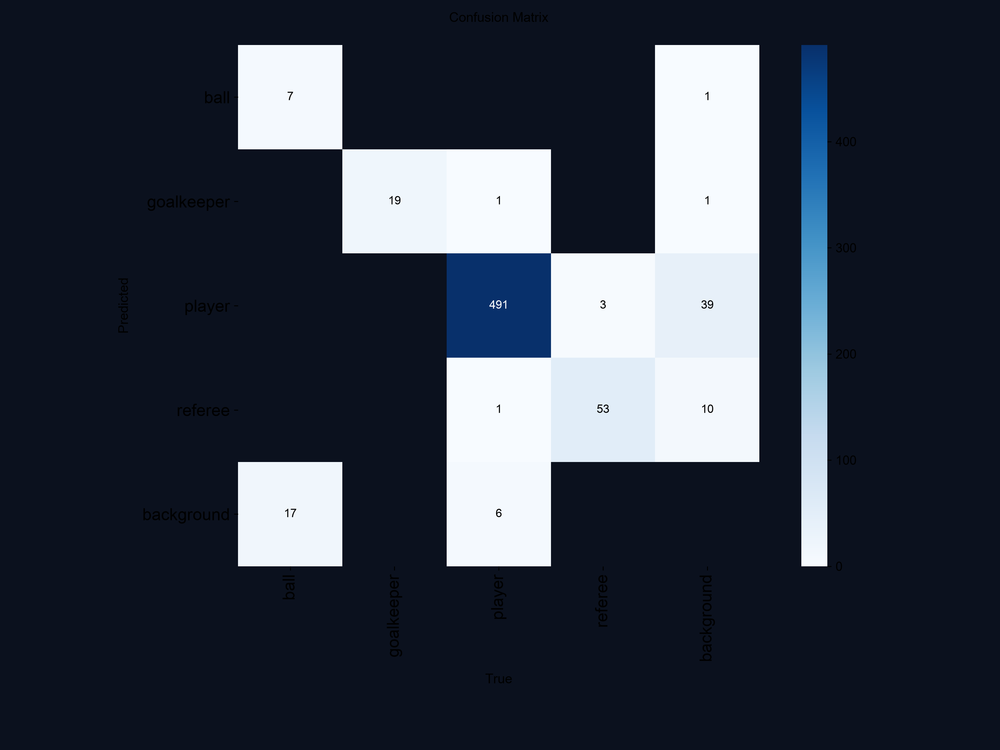

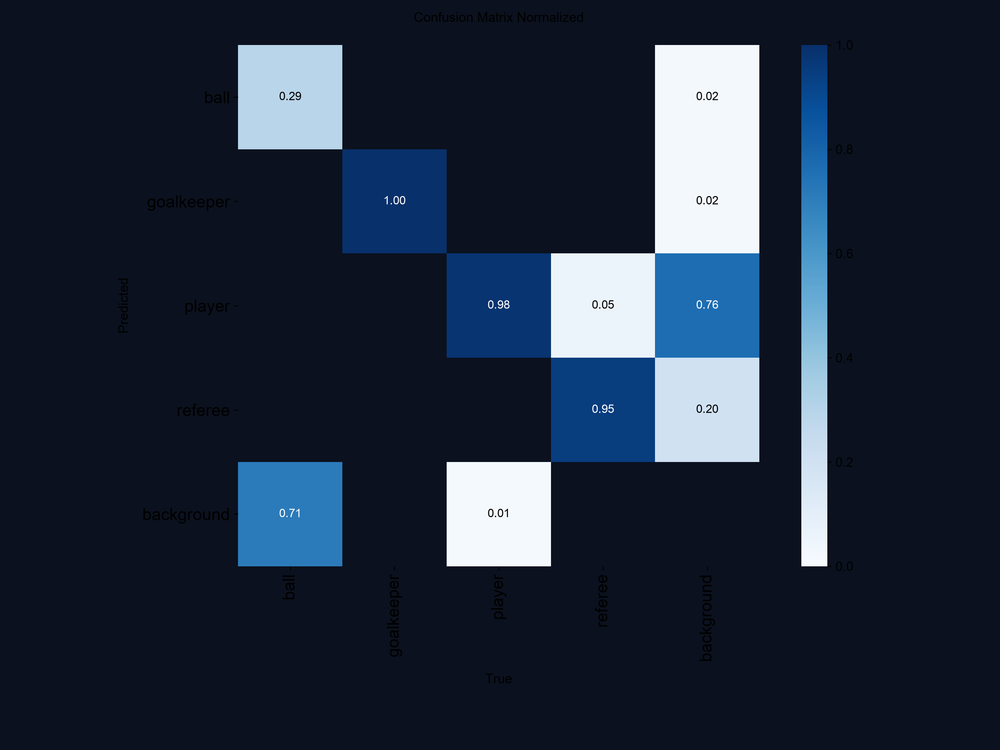

In [114]:
from IPython.display import Image as IPyImage, display

display(IPyImage(filename=f"{PLAYER_VAL_DIR}/confusion_matrix.png"))
display(IPyImage(filename=f"{PLAYER_VAL_DIR}/confusion_matrix_normalized.png"))


### 6.3, 6.4 & 6.5 — F1 / Precision / Recall confidence curves for player detection model

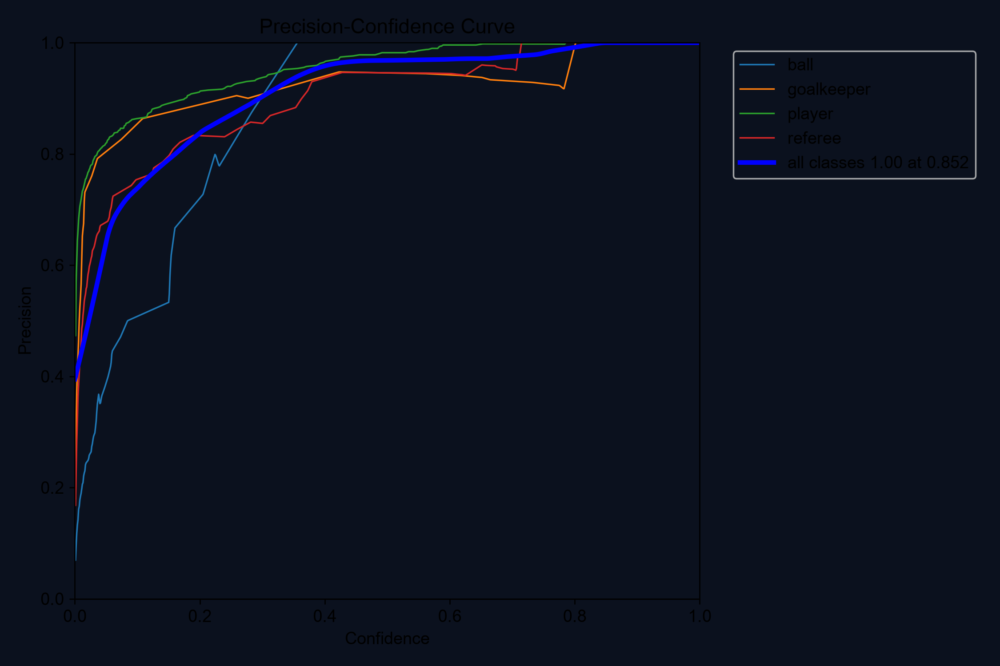

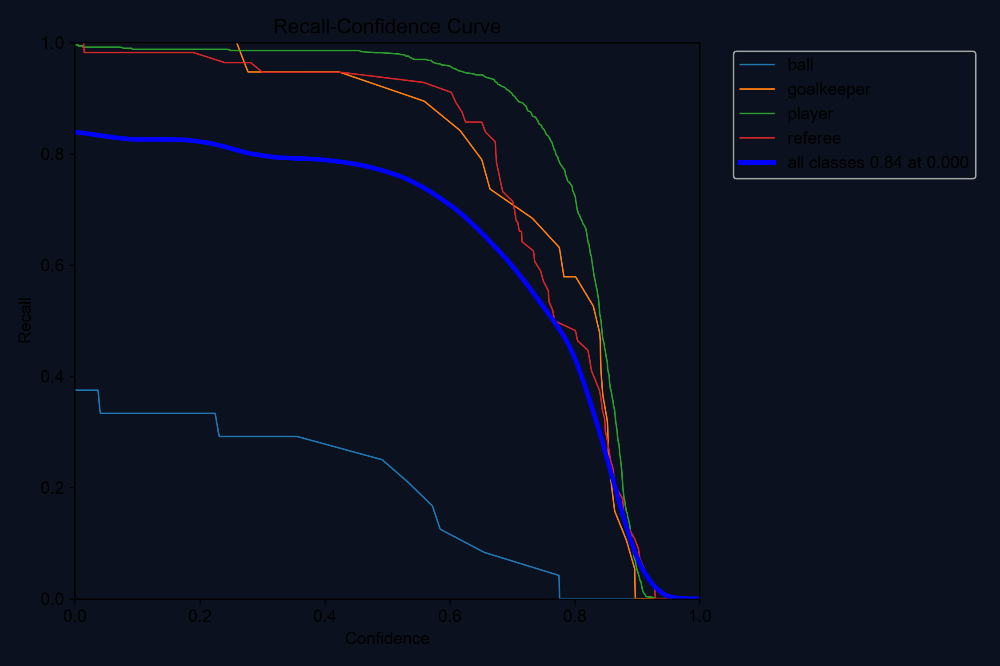

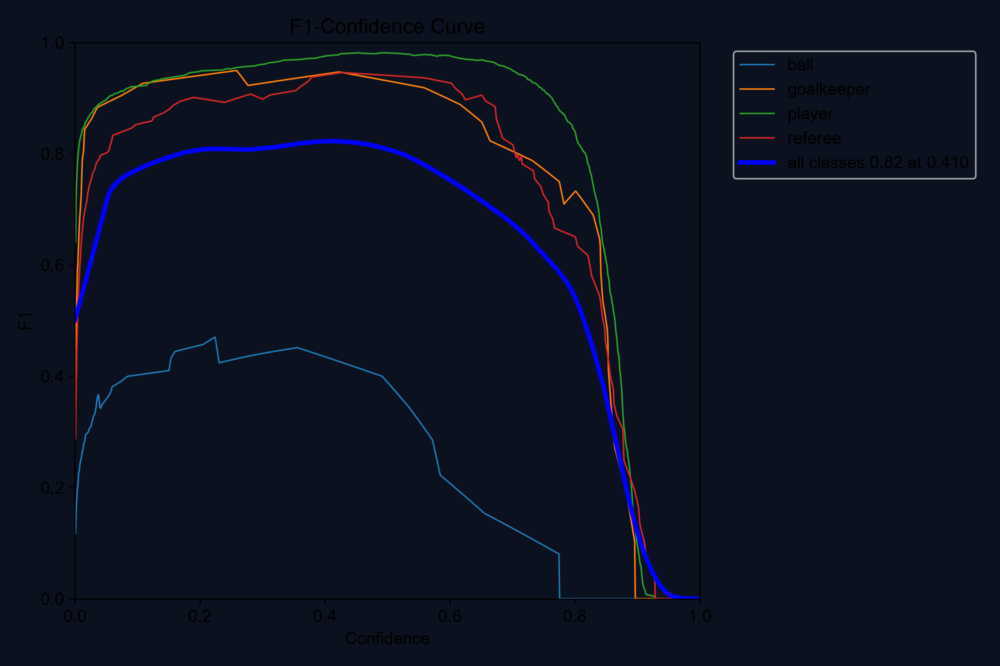

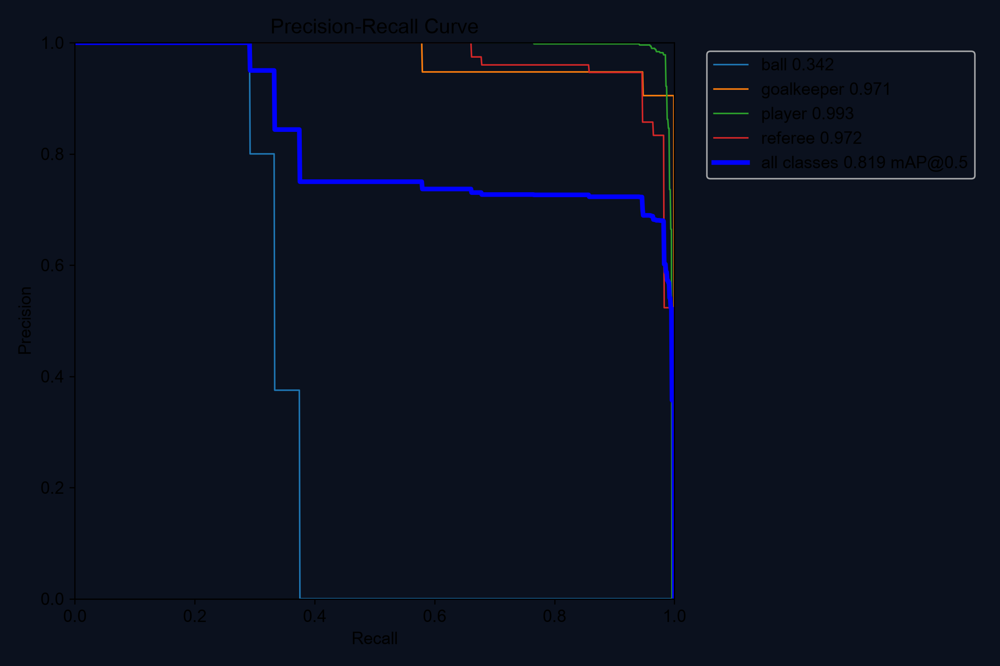

In [115]:
display(IPyImage(filename=f"{PLAYER_VAL_DIR}/BoxP_curve.png"))
display(IPyImage(filename=f"{PLAYER_VAL_DIR}/BoxR_curve.png"))
display(IPyImage(filename=f"{PLAYER_VAL_DIR}/BoxF1_curve.png"))
display(IPyImage(filename=f"{PLAYER_VAL_DIR}/BoxPR_curve.png"))


### 6.6 — Training curve graphs for player, referee and ball detection

`results.png` is the grid Ultralytics generates automatically every epoch: `train/box_loss`, `train/cls_loss`, `train/dfl_loss`, `metrics/precision(B)`, `metrics/recall(B)` on the top row, and the matching validation losses plus `metrics/mAP50(B)`, `metrics/mAP50-95(B)` on the bottom row.

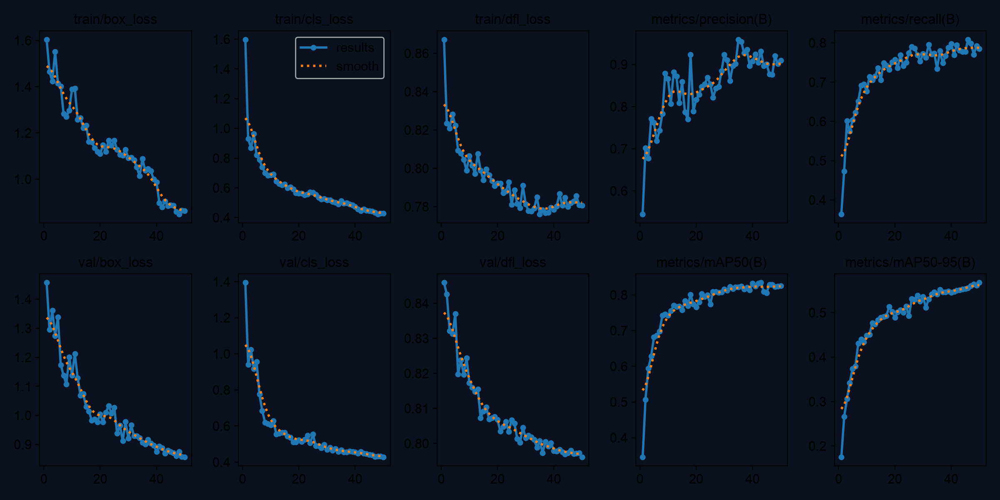

In [116]:
display(IPyImage(filename=f"{PLAYER_RUN_DIR}/results.png"))


**Note:** Print the final numeric metrics (overall + per-class) so they can be quoted directly in the report — precision, recall, mAP50 and mAP50-95, matching the numbers discussed for the player detection model (e.g. 96% player, 93% referee, 28% ball as reported in the normalized confusion matrix discussion).

In [117]:
import pandas as pd

class_names = player_val_metrics.names
per_class_map50 = player_val_metrics.box.ap50
per_class_map = player_val_metrics.box.maps

summary_rows = []
for idx, name in class_names.items():
    summary_rows.append({
        "class": name,
        "precision": player_val_metrics.box.p[idx],
        "recall": player_val_metrics.box.r[idx],
        "mAP50": per_class_map50[idx],
        "mAP50-95": per_class_map[idx],
    })

player_metrics_df = pd.DataFrame(summary_rows)
print(f"Overall  mAP50: {player_val_metrics.box.map50:.3f}   mAP50-95: {player_val_metrics.box.map:.3f}")
player_metrics_df


Overall  mAP50: 0.819   mAP50-95: 0.579


,class,precision,recall,mAP50,mAP50-95
0,ball,1.000000,0.274986,0.342000,0.117312
1,goalkeeper,0.943368,0.947368,0.970764,0.749314
2,player,0.968228,0.985972,0.992634,0.787838
3,referee,0.940485,0.946429,0.971765,0.661523


## ball, player, goalkeeper and referee detection

In [118]:
!pip install -q inference

python(93861) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 1.4.0 requires opencv-python-headless==4.10.0.84, but you have opencv-python-headless 5.0.0.93 which is incompatible.


In [119]:
!pip uninstall -y onnxruntime-gpu onnxruntime
!pip install -U inference inference-models onnxruntime

python(94395) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Found existing installation: onnxruntime 1.21.1
Uninstalling onnxruntime-1.21.1:
  Successfully uninstalled onnxruntime-1.21.1


python(94438) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.6/33.6 MB 7.8 MB/s  0:00:04m0:00:0100:01m


In [120]:
%pip install --upgrade --force-reinstall "inference-models[onnx-cpu]"

python(94524) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached setuptools-84.0.0-py3-none-any.whl.metadata (6.6 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached opencv_python_headless-5.0.0.93-cp37-abi3-macosx_13_0_arm64.whl.metadata (19 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached cffi-2.1.1-cp311-cp311-macosx_11_0_arm64.whl.metadata (2.5 kB)
  Using cached pkgconfig-1.6.0-py3-none-any.whl.metadata (4.9 kB)
  Using cached pycparser-3.0-py3-none-any.whl.metadata (8.2 kB)
  Installing build dependencies ... done
  Ge

In [121]:
import onnxruntime as ort

print("ONNX Runtime:", ort.__version__)
print("Available providers:", ort.get_available_providers())

ONNX Runtime: 1.22.1
Available providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']


In [122]:
import sys
import platform

print("Python:", sys.executable)
print("Platform:", platform.platform())

try:
    import onnxruntime as ort
    print("ONNX Runtime:", ort.__version__)
    print("Providers:", ort.get_available_providers())
except Exception as e:
    print("ONNX ERROR:", repr(e))

from inference_models import AutoModel

AutoModel.describe_compute_environment()

Python: /Users/suraj/Desktop/VISION11/venv/bin/python
Platform: macOS-15.5-arm64-arm-64bit
ONNX Runtime: 1.22.1
Providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']


                                        Compute environment details                                        
 Detected GPUs:                      N/A                                                                   
 Detected GPUs CUDA CC:              N/A                                                                   
 NVIDIA driver:                      N/A                                                                   
 CUDA version:                       N/A                                                                   
 TRT version:                        N/A                                                                   
 TRT Python package available:       False                                                                 
 OS version:                         macos-15.5-arm64-arm-64bit                                            
 torch version:                      2.13.0                                                                
 torchvision version:                0.28.0                                                                
 ONNX runtime version:               1.22.1                                                                
 Detected ONNX execution providers:  CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider

In [123]:
%pip uninstall -y onnxruntime onnxruntime-silicon onnxruntime-gpu
%pip install --no-cache-dir onnxruntime
%pip install --upgrade "inference-models[onnx-cpu]"

python(98116) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Found existing installation: onnxruntime 1.22.1
Uninstalling onnxruntime-1.22.1:
  Successfully uninstalled onnxruntime-1.22.1
Note: you may need to restart the kernel to use updated packages.


python(98123) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 2.5 MB/s  0:00:07 eta 0:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 1.4.1 requires av==14.2.0, but you have av 18.1.0 which is incompatible.
inference 1.4.1 requires click<8.2.0, but you have click 8.4.2 which is incompatible.
inference 1.4.1 requires numpy<2.4.0,>=2.0.0, but you have numpy 2.4.6 which is incompatible.
inference 1.4.1 requires onnxruntime<1.22.0,>=1.15.1, but you have onnxruntime 1.28.0 which is incompatible.
inference 1.4.1 requires opencv-python<4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is incompatible.
inference 1.4.1 requires opencv-python<=4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is incompatible.
inference 1.4.1 requires packaging~=24.0, but you have packaging 26.3 which is incompatible.
inference 1.4.1 requires pydantic<2.

python(98383) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Using cached onnxruntime-1.22.1-cp311-cp311-macosx_13_0_universal2.whl.metadata (4.6 kB)
Using cached onnxruntime-1.22.1-cp311-cp311-macosx_13_0_universal2.whl (34.3 MB)
  Attempting uninstall: onnxruntime
    Found existing installation: onnxruntime 1.28.0
    Uninstalling onnxruntime-1.28.0:
      Successfully uninstalled onnxruntime-1.28.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 1.4.1 requires av==14.2.0, but you have av 18.1.0 which is incompatible.
inference 1.4.1 requires click<8.2.0, but you have click 8.4.2 which is incompatible.
inference 1.4.1 requires numpy<2.4.0,>=2.0.0, but you have numpy 2.4.6 which is incompatible.
inference 1.4.1 requires onnxruntime<1.22.0,>=1.15.1, but you have onnxruntime 1.22.1 which is incompatible.
inference 1.4.1 requires opencv-python<4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is in

In [124]:
import sys
import platform

print("Python:", sys.executable)
print("Platform:", platform.platform())

try:
    import onnxruntime as ort
    print("ONNX Runtime:", ort.__version__)
    print("Providers:", ort.get_available_providers())
except Exception as e:
    print("ONNX ERROR:", repr(e))

from inference_models import AutoModel

AutoModel.describe_compute_environment()

Python: /Users/suraj/Desktop/VISION11/venv/bin/python
Platform: macOS-15.5-arm64-arm-64bit
ONNX Runtime: 1.22.1
Providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']


                                        Compute environment details                                        
 Detected GPUs:                      N/A                                                                   
 Detected GPUs CUDA CC:              N/A                                                                   
 NVIDIA driver:                      N/A                                                                   
 CUDA version:                       N/A                                                                   
 TRT version:                        N/A                                                                   
 TRT Python package available:       False                                                                 
 OS version:                         macos-15.5-arm64-arm-64bit                                            
 torch version:                      2.13.0                                                                
 torchvision version:                0.28.0                                                                
 ONNX runtime version:               1.22.1                                                                
 Detected ONNX execution providers:  CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider

In [125]:
import onnxruntime as ort

print("ONNX Runtime:", ort.__version__)
print("Providers:", ort.get_available_providers())

ONNX Runtime: 1.22.1
Providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']


In [126]:
# Uninstall any broken/conflicting onnxruntime installs
!pip uninstall -y onnxruntime onnxruntime-gpu

# Reinstall a clean CPU build
!pip install --no-cache-dir onnxruntime

# Verify it actually works before moving on
import onnxruntime as ort
print("Available providers:", ort.get_available_providers())
assert "CPUExecutionProvider" in ort.get_available_providers(), \
    "onnxruntime still broken — see troubleshooting below"

python(98502) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Found existing installation: onnxruntime 1.22.1
Uninstalling onnxruntime-1.22.1:
  Successfully uninstalled onnxruntime-1.22.1


python(98524) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 4.0 MB/s  0:00:04m0:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 1.4.1 requires av==14.2.0, but you have av 18.1.0 which is incompatible.
inference 1.4.1 requires click<8.2.0, but you have click 8.4.2 which is incompatible.
inference 1.4.1 requires numpy<2.4.0,>=2.0.0, but you have numpy 2.4.6 which is incompatible.
inference 1.4.1 requires onnxruntime<1.22.0,>=1.15.1, but you have onnxruntime 1.28.0 which is incompatible.
inference 1.4.1 requires opencv-python<4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is incompatible.
inference 1.4.1 requires opencv-python<=4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is incompatible.
inference 1.4.1 requires packaging~=24.0, but you have packaging 26.3 which is incompatible.
inference 1.4.1 requires pydantic<2

In [127]:
%pip install --force-reinstall --no-cache-dir onnxruntime==1.19.2

python(98659) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 3.7 MB/s  0:00:04 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 3.8 MB/s  0:00:01 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 3.8 MB/s  0:00:01 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 3.8 MB/s  0:00:00
  Attempting uninstall: mpmath
    Found existing installation: mpmath 1.3.0
    Uninstalling mpmath-1.3.0:
      Successfully uninstalled mpmath-1.3.0
  Attempting uninstall: flatbuffers━━━━━━━━━━━━━ 0/9 [mpmath]
    Found existing installation: flatbuffers 25.12.19m0/9 [mpmath]
    Uninstalling flatbuffers-25.12.19:━━━━━━ 0/9 [mpmath]
      Successfully uninstalled flatbuffers-25.12.1932m0/9 [mpmath]
  Attempting uninstall: sympy0m━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/9 [flatbuffers]
    Found existing installation: sympy 1.14.0━━━━━━━━━━━━━━━━━ 1/9 [flatbuffers]
    Uninstalling sympy-1.14.0:━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/9 [sympy]s]
      Successfully

In [128]:
import sys
import onnxruntime as ort

print("Python:", sys.executable)
print("ONNX Runtime:", ort.__version__)
print("Providers:", ort.get_available_providers())

Python: /Users/suraj/Desktop/VISION11/venv/bin/python
ONNX Runtime: 1.22.1
Providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']


In [129]:
import sys, subprocess
out = subprocess.run(
    [sys.executable, "-m", "pip", "show", "inference", "inference-models"],
    capture_output=True, text=True
)
print(out.stdout)

python(99538) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Name: inference
Version: 1.4.1
Summary: With no prior knowledge of machine learning or device-specific deployment, you can deploy a computer vision model to a range of devices and environments using Roboflow Inference.
Home-page: https://github.com/roboflow/inference
Author: Roboflow
Author-email: help@roboflow.com
License: 
Location: /Users/suraj/Desktop/VISION11/venv/lib/python3.11/site-packages
Requires: aiohttp, aiortc, anthropic, APScheduler, asyncua, av, backoff, boto3, botocore, cachetools, click, cython, dataclasses-json, docker, fastapi, filelock, httpx, inference-models, msgpack, networkx, numpy, nvidia-ml-py, onnxruntime, onvif-zeep-async, openai, opencv-contrib-python, opencv-python, packaging, paho-mqtt, pandas, pillow, prometheus-fastapi-instrumentator, psutil, py-cpuinfo, pybase64, pydantic, pydantic-settings, pydot, pylogix, pymodbus, pytest, python-dotenv, PyYAML, qrcode, redis, requests, requests-toolbelt, rich, scikit-image, setuptools, shapely, simple-pid, slack-sdk

In [130]:
import sys
!{sys.executable} -m pip install --no-cache-dir "inference-models[onnx-cpu]"

python(99574) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [131]:
%pip uninstall onnxruntime onnxruntime-gpu onnxruntime-silicon -y
%pip install "onnxruntime<1.22.0,>=1.15.1"
%pip install --upgrade pip
%pip install inference

python(99638) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Found existing installation: onnxruntime 1.19.2
Uninstalling onnxruntime-1.19.2:
  Successfully uninstalled onnxruntime-1.19.2
Note: you may need to restart the kernel to use updated packages.


python(99641) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Using cached onnxruntime-1.21.1-cp311-cp311-macosx_13_0_universal2.whl.metadata (4.5 kB)
Using cached onnxruntime-1.21.1-cp311-cp311-macosx_13_0_universal2.whl (33.6 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 1.4.1 requires av==14.2.0, but you have av 18.1.0 which is incompatible.
inference 1.4.1 requires click<8.2.0, but you have click 8.4.2 which is incompatible.
inference 1.4.1 requires numpy<2.4.0,>=2.0.0, but you have numpy 2.4.6 which is incompatible.
inference 1.4.1 requires opencv-python<4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is incompatible.
inference 1.4.1 requires opencv-python<=4.13.0,>=4.8.1.78, but you have opencv-python 4.14.0.94 which is incompatible.
inference 1.4.1 requires packaging~=24.0, but you have packaging 26.3 which is incompatible.
inference 1.4.1 requires pydantic<2.12.0,>=2.8.0, but you ha

python(99769) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Note: you may need to restart the kernel to use updated packages.


python(99798) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Using cached opencv_python-4.12.0.88-cp37-abi3-macosx_13_0_arm64.whl.metadata (19 kB)
INFO: pip is looking at multiple versions of huggingface-hub to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of huggingface-hub to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.1/22.1 MB 3.6 MB/s  0:00:06m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.6/660.6 kB 3.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 5.0 MB/s  0:00:01m0:00:0100:01
Using cached opencv_python-4.12.0.88-cp37-abi3-macosx_13_0_arm64.whl (37.9 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [132]:
import onnxruntime
print("Raw onnxruntime providers:", onnxruntime.get_available_providers())

from inference_models import AutoModel
AutoModel.describe_compute_environment()

Raw onnxruntime providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']


                                        Compute environment details                                        
 Detected GPUs:                      N/A                                                                   
 Detected GPUs CUDA CC:              N/A                                                                   
 NVIDIA driver:                      N/A                                                                   
 CUDA version:                       N/A                                                                   
 TRT version:                        N/A                                                                   
 TRT Python package available:       False                                                                 
 OS version:                         macos-15.5-arm64-arm-64bit                                            
 torch version:                      2.13.0                                                                
 torchvision version:                0.28.0                                                                
 ONNX runtime version:               1.22.1                                                                
 Detected ONNX execution providers:  CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider

In [133]:
AutoModel.describe_model("football-players-detection-3zvbc/11")

                      Model overview                      
 Model ID:            football-players-detection-3zvbc/11 
 Architecture:        yolov8                              
 Variant:             yolov8-x                            
 Task:                object-detection                    
 Weights provider:    roboflow                            
 Number of packages:  5

                                      Model packages                                       
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━━┓
┃                ID                ┃ backend ┃ batch size ┃ quantization ┃ size ┃ trusted ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━━┩
│ 170b8fff4bdebc22764bad9e8774664f │   trt   │     1      │     fp16     │ N/A  │  True   │
├──────────────────────────────────┼─────────┼────────────┼──────────────┼──────┼─────────┤
│ 72bf025f253b1d177ec7d3b840a98d2b │   trt   │     1      │     fp32     │ N/A  │  True   │
├──────────────────────────────────┼─────────┼────────────┼──────────────┼──────┼─────────┤
│ 86dac33309c8eee35b5c276627d22c62 │   trt   │     1      │     fp32     │ N/A  │  True   │
├──────────────────────────────────┼─────────┼────────────┼──────────────┼──────┼─────────┤
│ d0870d181d6e2da92574c2b0268a4ea3 │   trt   │     1      │     fp16     │ N/A  │  True   │
├──────────────────────────────────┼─────────┼────────────┼──────────────┼──────┼─────────┤
│ d9e17d96240d37f366490718373a0555 │  onnx   │     1      │     fp32     │ N/A  │  True   │
└──────────────────────────────────┴─────────┴────────────┴──────────────┴──────┴─────────┘

Want to check more details about specific package?
Use AutoModel.describe_model_package('model_id', 'package_id').

Want to verify the size of model package?
Use AutoModel.describe_model('model_id', pull_artefacts_size=True) - the execution will be slightly longer, as we 
must collect the size of all elements of model package.

In [134]:
import onnxruntime
print("onnxruntime providers:", onnxruntime.get_available_providers())

from inference_models.developer_tools import get_selected_onnx_execution_providers
print("inference_models selected providers:", get_selected_onnx_execution_providers())

from inference_models import AutoModel
AutoModel.describe_compute_environment()

onnxruntime providers: ['CoreMLExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']
inference_models selected providers: []


                                        Compute environment details                                        
 Detected GPUs:                      N/A                                                                   
 Detected GPUs CUDA CC:              N/A                                                                   
 NVIDIA driver:                      N/A                                                                   
 CUDA version:                       N/A                                                                   
 TRT version:                        N/A                                                                   
 TRT Python package available:       False                                                                 
 OS version:                         macos-15.5-arm64-arm-64bit                                            
 torch version:                      2.13.0                                                                
 torchvision version:                0.28.0                                                                
 ONNX runtime version:               1.22.1                                                                
 Detected ONNX execution providers:  CoreMLExecutionProvider, AzureExecutionProvider, CPUExecutionProvider

In [135]:
from inference import get_model

ROBOFLOW_API_KEY = "ITorBkFWNnpJm5kb0lAc"

PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc/11"



PLAYER_DETECTION_MODEL = get_model(
    model_id="football-players-detection-3zvbc/11",
    api_key=ROBOFLOW_API_KEY,
    onnx_execution_providers=["CoreMLExecutionProvider", "CPUExecutionProvider"],
)
print("Player detection model loaded successfully!")

2026-08-16 17:38:28.338966 [W:onnxruntime:, helper.cc:83 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/Reshape_output_0, shape: {1,68,25600}
2026-08-16 17:38:28.339197 [W:onnxruntime:, helper.cc:83 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/Split_output_0, shape: {1,64,33600}
2026-08-16 17:38:28.339230 [W:onnxruntime:, helper.cc:83 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/dfl/Reshape_output_0, shape: {1,4,16,33600}
2026-08-16 17:38:28.339238 [W:onnxruntime:, helper.cc:83 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/dfl/Transpose_output_0, shape: {1,33600,4,16}
2026-08-16 17:38:28.339243 [W:onnxruntime:, helper.cc:83 IsInputSupported] CoreML does not support input dim > 16384. Input:/model.22/dfl/Softmax_output_0, shape: {1,33600,4,16}
2026-08-16 17:38:28.339249 [W:onnxruntime:, helper.cc:83 IsInputSupported] CoreML does not support input dim > 16384. Inpu

Player detection model loaded successfully!


In [136]:
%matplotlib inline

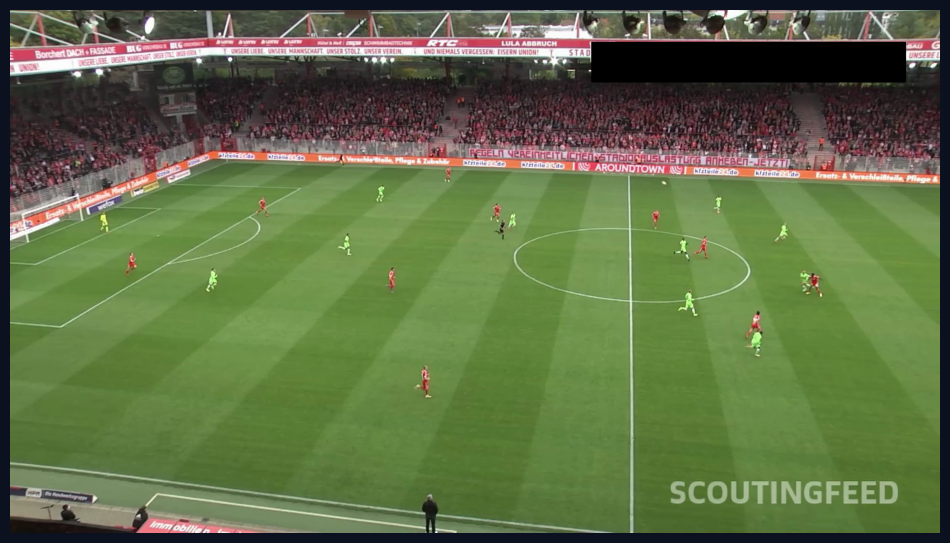

In [137]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

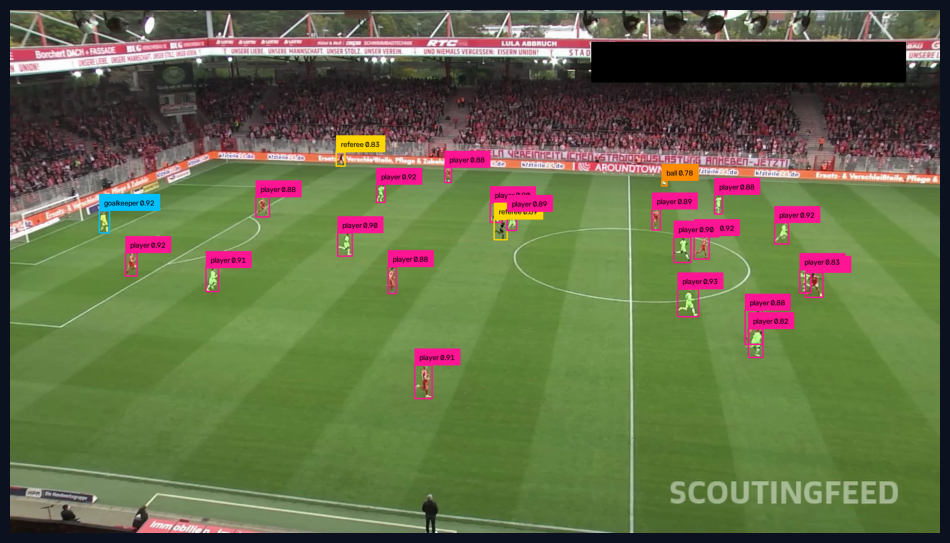

In [138]:
import supervision as sv
import torch

# --- Fix for: AttributeError: module 'torch.mps' has no attribute 'current_device' ---
# MPS only ever has one device, so this shim just returns 0.
if not hasattr(torch.mps, "current_device"):
    torch.mps.current_device = lambda: 0
# ----------------------------------------------------------------------------------

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections
)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels
)

sv.plot_image(annotated_frame)

## video game style visualization

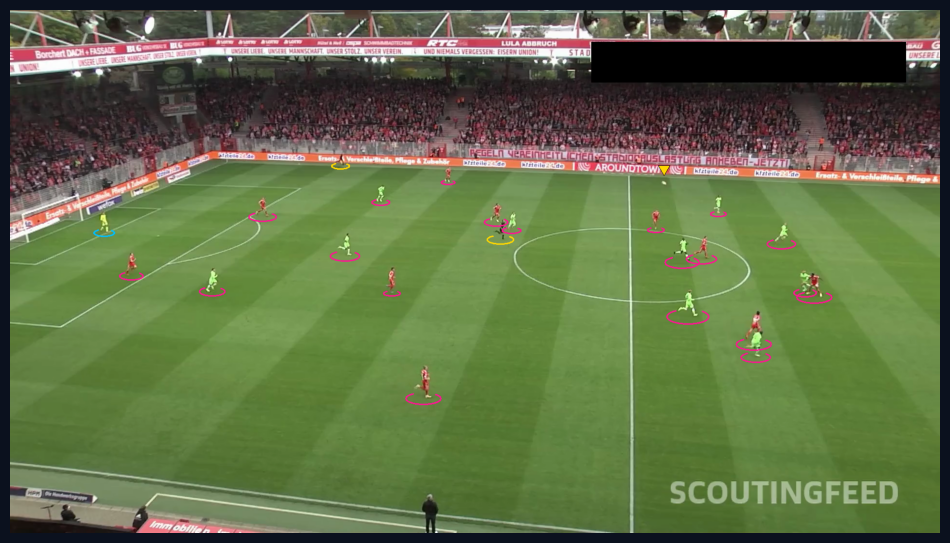

In [139]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

## player tracking

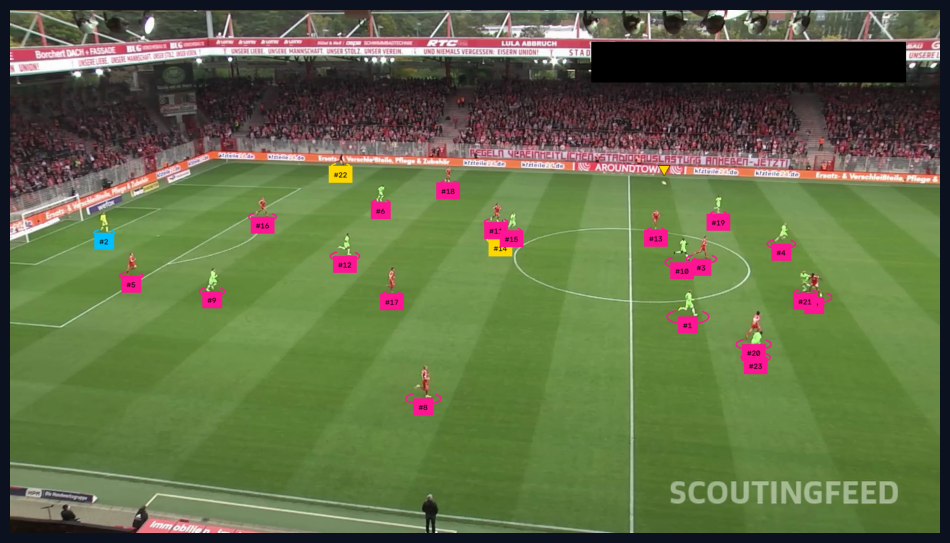

In [140]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

## split players into teams

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-team-clustering.png)

**Note:** Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

In [141]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 25it [00:18,  1.35it/s]


**Note:** Here's a sample (100 elements) of the crops we've gathered.

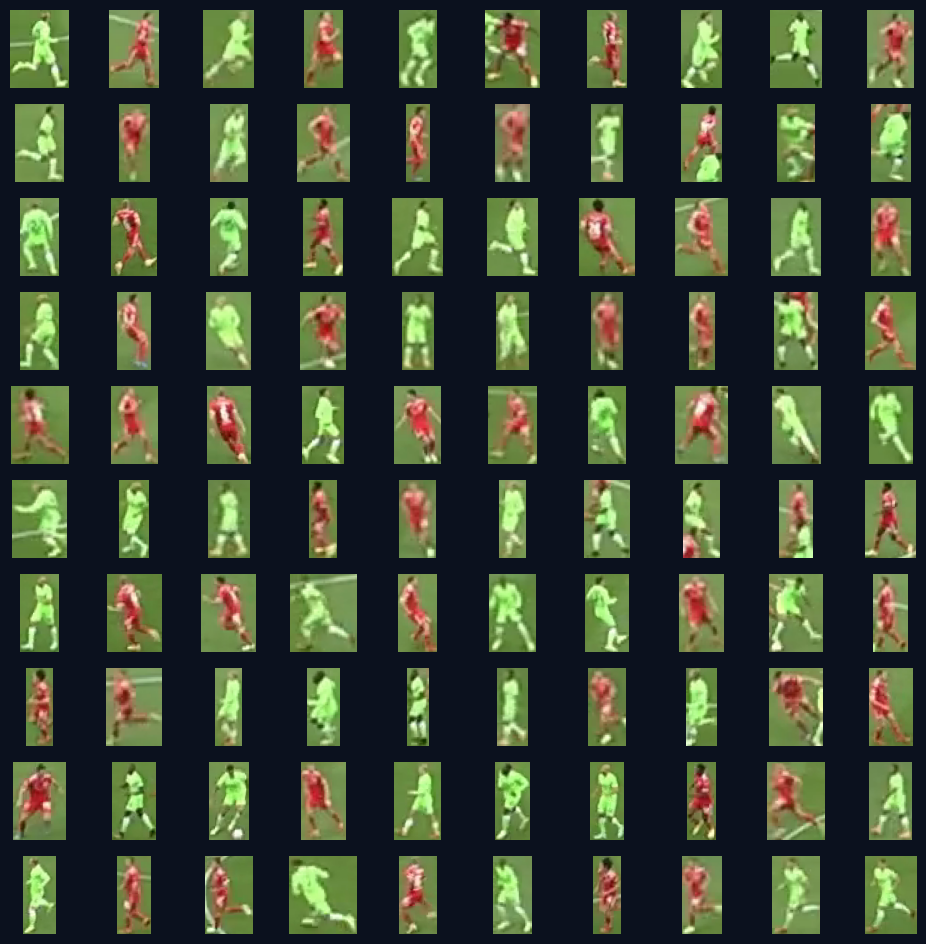

In [142]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

**Note:** Next, we'll run [SigLIP](https://huggingface.co/docs/transformers/en/model_doc/siglip) to calculate embeddings for each of the crops.

In [143]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

In [144]:
!pip install more-itertools

python(1265) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [145]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 16it [01:03,  3.96s/it]


**Note:** Using [UMAP](https://github.com/lmcinnes/umap), we project our embeddings from `(N, 768)` to `(N, 3)` and then perform a two-cluster division using [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

In [146]:
import umap
from sklearn.cluster import KMeans

REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

In [147]:
projections = REDUCER.fit_transform(data)
clusters = CLUSTERING_MODEL.fit_predict(projections)

divide by zero encountered in matmul
overflow encountered in matmul
invalid value encountered in matmul


**Note:** Here's an interactive visualization of our results. Click on a dot to display its associated crop.

In [148]:
!pip install plotly

python(2478) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Extracted 19 player crops


Loading weights:   0%|          | 0/408 [00:00<?, ?it/s]

Embeddings shape: (19, 768)
Projections shape: (19, 3)
Cluster counts: [5 5 7 2]


n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
divide by zero encountered in matmul
overflow encountered in matmul
invalid value encountered in matmul



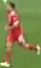
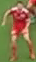
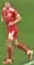
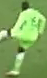
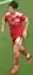
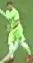
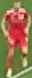
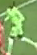

In [149]:
# ============================================================
# 1. INSTALL (run once)
# ============================================================
# !pip install transformers umap-learn scikit-learn plotly pillow

# ============================================================
# 2. CROP PLAYER DETECTIONS FROM THE FRAME
# ============================================================
import supervision as sv
from PIL import Image
import numpy as np

crops = []
for xyxy in detections.xyxy:
    cropped = sv.crop_image(frame, xyxy)          # BGR numpy array (OpenCV)
    cropped_rgb = cropped[:, :, ::-1]              # BGR -> RGB
    crops.append(Image.fromarray(cropped_rgb))     # convert to PIL

print(f"Extracted {len(crops)} player crops")

# ============================================================
# 3. EXTRACT EMBEDDINGS (SigLIP)
# ============================================================
import torch
from transformers import AutoProcessor, AutoModel

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

EMBEDDING_MODEL_ID = "google/siglip-base-patch16-224"
processor = AutoProcessor.from_pretrained(EMBEDDING_MODEL_ID)
embedding_model = AutoModel.from_pretrained(EMBEDDING_MODEL_ID).to(DEVICE)

def get_embeddings(images: list[Image.Image], batch_size: int = 32) -> np.ndarray:
    all_embeddings = []
    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]
        inputs = processor(images=batch, return_tensors="pt").to(DEVICE)
        with torch.no_grad():
            output = embedding_model.get_image_features(**inputs)
            if hasattr(output, "cpu"):
                image_features = output
            elif hasattr(output, "pooler_output"):
                image_features = output.pooler_output
            elif hasattr(output, "image_embeds"):
                image_features = output.image_embeds
            else:
                image_features = output.last_hidden_state.mean(dim=1)
        all_embeddings.append(image_features.cpu().numpy())
    return np.concatenate(all_embeddings, axis=0)

embeddings = get_embeddings(crops)
print(f"Embeddings shape: {embeddings.shape}")

# ============================================================
# 4. REDUCE TO 3D (UMAP)
# ============================================================
import umap

reducer = umap.UMAP(n_components=3, random_state=42)
projections = reducer.fit_transform(embeddings)
print(f"Projections shape: {projections.shape}")

# ============================================================
# 5. CLUSTER (KMeans)
# ============================================================
from sklearn.cluster import KMeans

N_CLUSTERS = 4
kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=42, n_init="auto")
clusters = kmeans.fit_predict(embeddings)
print(f"Cluster counts: {np.bincount(clusters)}")

# ============================================================
# 6. VISUALIZE
# ============================================================
import plotly.graph_objects as go
from typing import List
from IPython.display import display, HTML   # <-- fixed: was IPython.core.display
import base64
from io import BytesIO


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    all_axes = projections
    min_val = np.min(all_axes)
    max_val = np.max(all_axes)
    padding = (max_val - min_val) * 0.05
    axis_range = [min_val - padding, max_val + padding]

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='X', range=axis_range),
            yaxis=dict(title='Y', range=axis_range),
            zaxis=dict(title='Z', range=axis_range),
            aspectmode='cube'
        ),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    display(HTML(html_template))


display_projections(clusters, projections, crops)

**Note:** To simplify the use of the SigLIP, UMAP, and KMeans combo, I've packaged all these models into a [`TeamClassifier`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/team.py#L41) that you can find in the [sports](https://github.com/roboflow/sports) repository.

In [150]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier
import torch

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]  # fixed: was detections.xyxy
    crops += players_crops

if torch.cuda.is_available():
    DEVICE = "cuda"
elif torch.backends.mps.is_available():
    DEVICE = "mps"
else:
    DEVICE = "cpu"

print(f"Using device: {DEVICE}")

team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

collecting crops: 25it [00:10,  2.33it/s]


Using device: mps


Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

Embedding extraction: 16it [00:37,  2.37s/it]
divide by zero encountered in matmul
overflow encountered in matmul
invalid value encountered in matmul


**Note:** Time to assign goalkeepers to teams. We'll use a simple heuristic: calculate the average position (centroid) of the players belonging to both teams and then assign the goalkeeper to the team whose average position is closer.

In [151]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

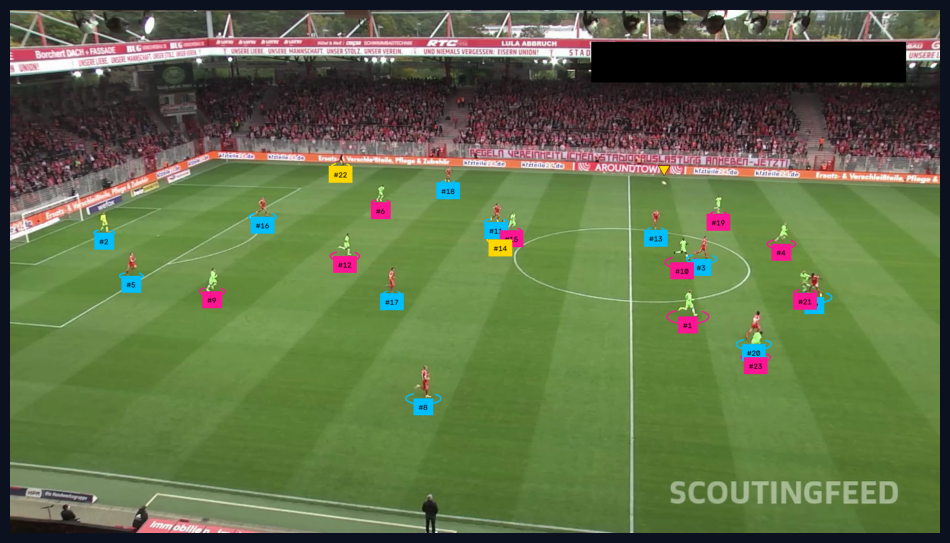

In [152]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

## Train field key point detection model (YOLOv8)

Same idea as above, applied to the field key-point dataset. Each pitch landmark (e.g. `TLC`, `TRC`, `TR6MC`, `BL18ML`, `BRArc` ...) is treated as its own object class, so this is trained as a normal YOLOv8 object detection model, not a pose model — matching the confusion matrix layout used in the report (`6.7` – `6.11`).

In [153]:
# Replace with your own Roboflow field key-point project/version.
FIELD_DATASET_WORKSPACE = "roboflow-jvuqo"
FIELD_DATASET_PROJECT = "football-field-detection-f07vi"
FIELD_DATASET_VERSION = 14

field_project = rf.workspace(FIELD_DATASET_WORKSPACE).project(FIELD_DATASET_PROJECT)
field_version = field_project.version(FIELD_DATASET_VERSION)
field_dataset = field_version.download("yolov8")

print("Dataset downloaded to:", field_dataset.location)


loading Roboflow workspace...


loading Roboflow project...
Dataset downloaded to: /Users/suraj/Desktop/VISION11/sports_football/notebook/football-field-detection-14


In [154]:
import os
import glob
import shutil
import yaml
import torch
from ultralytics import YOLO

# ============================================================
# STEP 0: Detect dataset type (bbox-only vs keypoint/pose)
# ============================================================
def get_kpt_shape():
    with open(f"{field_dataset.location}/data.yaml") as f:
        cfg = yaml.safe_load(f)
    kpt_shape = cfg.get("kpt_shape")  # e.g. [32, 3] -> 32 keypoints, (x,y,visibility)
    if kpt_shape:
        print(f"Detected kpt_shape in data.yaml: {kpt_shape}")
    else:
        print("No kpt_shape found — treating as a standard bbox dataset")
    return kpt_shape

KPT_SHAPE = get_kpt_shape()

# ============================================================
# STEP 1: Backup + repair corrupted labels in place (train/valid/test)
# ============================================================
def repair_labels(split_dir_name):
    label_dir = f"{field_dataset.location}/{split_dir_name}/labels"
    backup_dir = f"{field_dataset.location}/{split_dir_name}/labels_backup"

    if not os.path.exists(label_dir):
        print(f"No {label_dir} found, skipping")
        return

    if not os.path.exists(backup_dir):
        shutil.copytree(label_dir, backup_dir)
        print(f"Backed up {split_dir_name} labels to {backup_dir}")

    label_files = glob.glob(f"{label_dir}/*.txt")
    print(f"[{split_dir_name}] Found {len(label_files)} label files")
    repaired_count = 0

    num_kpts, kdims = (KPT_SHAPE[0], KPT_SHAPE[1]) if KPT_SHAPE else (0, 0)

    for lf in label_files:
        with open(lf) as fh:
            lines = fh.readlines()
        new_lines = []
        changed = False

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 5:
                continue

            cls = parts[0]
            vals = [float(x) for x in parts[1:]]

            # bbox = x, y, w, h -> safe to clamp, these should always be in [0,1]
            bbox = vals[:4]
            clamped_bbox = [min(max(c, 0.0), 1.0) for c in bbox]
            if clamped_bbox != bbox:
                changed = True

            kpts = vals[4:]

            if KPT_SHAPE and len(kpts) == num_kpts * kdims:
                # Proper keypoint handling: out-of-range = "not visible", not clamp-to-edge
                for i in range(0, len(kpts), kdims):
                    x, y = kpts[i], kpts[i + 1]
                    if x < 0 or x > 1 or y < 0 or y > 1:
                        kpts[i] = 0.0
                        kpts[i + 1] = 0.0
                        if kdims == 3:
                            kpts[i + 2] = 0.0  # visibility flag -> not labeled
                        changed = True
            elif kpts:
                # Fallback for anything unexpected: clamp rather than drop
                clamped_kpts = [min(max(c, 0.0), 1.0) for c in kpts]
                if clamped_kpts != kpts:
                    changed = True
                kpts = clamped_kpts

            out_vals = clamped_bbox + kpts
            new_lines.append(" ".join([cls] + [f"{v:.6f}" for v in out_vals]))

        if changed:
            repaired_count += 1
            with open(lf, "w") as fh:
                fh.write("\n".join(new_lines) + "\n")

    print(f"[{split_dir_name}] Repaired {repaired_count} / {len(label_files)} label files")

for split in ("train", "valid", "test"):
    repair_labels(split)

# ============================================================
# STEP 2: Clear stale cache so Ultralytics re-reads repaired labels
# ============================================================
for split in ("train", "valid", "test"):
    cache_file = f"{field_dataset.location}/{split}/labels.cache"
    if os.path.exists(cache_file):
        os.remove(cache_file)
        print(f"Removed {cache_file}")

# ============================================================
# STEP 3: Device / training config
# ============================================================
if torch.cuda.is_available():
    TRAIN_DEVICE, TRAIN_IMGSZ, TRAIN_BATCH, TRAIN_AMP = 0, 1280, 16, True
elif torch.backends.mps.is_available():
    TRAIN_DEVICE, TRAIN_IMGSZ, TRAIN_BATCH, TRAIN_AMP = "mps", 640, 8, False
else:
    TRAIN_DEVICE, TRAIN_IMGSZ, TRAIN_BATCH, TRAIN_AMP = "cpu", 640, 8, False

# Pick base arch by GPU tier, then switch to the -pose variant if this is a keypoint dataset
_base_arch = "yolov8m.pt" if TRAIN_DEVICE == 0 else "yolov8s.pt"
if KPT_SHAPE:
    TRAIN_ARCH = _base_arch.replace(".pt", "-pose.pt")
    print(f"Keypoint dataset detected -> using pose architecture: {TRAIN_ARCH}")
else:
    TRAIN_ARCH = _base_arch

def log_epochs(model):
    def _log(trainer):
        parts = [f"EPOCH {trainer.epoch + 1}/{trainer.epochs}"]
        if trainer.tloss is not None:
            tloss = trainer.tloss
            if isinstance(tloss, dict):
                losses = [float(v) for v in tloss.values()]
            else:
                losses = torch.atleast_1d(tloss.detach().float().cpu()).tolist()
            parts += [f"{name}={value:.4f}" for name, value in zip(trainer.loss_names, losses)]
        parts += [
            f"{key.split('/')[-1].replace('(B)', '')}={value:.4f}"
            for key, value in trainer.metrics.items()
            if key.startswith("metrics/")
        ]
        print("  ".join(parts), flush=True)
    model.add_callback("on_fit_epoch_end", _log)

# ============================================================
# STEP 4: Train
# ============================================================
FIELD_MODEL_ARCH = TRAIN_ARCH
FIELD_RUN_NAME = "field_keypoint_detection"

print(f"device={TRAIN_DEVICE} model={FIELD_MODEL_ARCH} imgsz={TRAIN_IMGSZ} batch={TRAIN_BATCH}")

field_yolo = YOLO(FIELD_MODEL_ARCH)
log_epochs(field_yolo)

field_train_results = field_yolo.train(
    data=f"{field_dataset.location}/data.yaml",
    epochs=50,
    imgsz=TRAIN_IMGSZ,
    batch=TRAIN_BATCH,
    device=TRAIN_DEVICE,
    amp=TRAIN_AMP,
    workers=4,
    cache=True,
    name=FIELD_RUN_NAME,
    patience=15,
)
FIELD_RUN_DIR = field_train_results.save_dir
print("Training artifacts saved to:", FIELD_RUN_DIR)



Detected kpt_shape in data.yaml: [32, 3]
[train] Found 255 label files
[train] Repaired 0 / 255 label files
[valid] Found 34 label files
[valid] Repaired 0 / 34 label files
[test] Found 28 label files
[test] Repaired 0 / 28 label files
Removed /Users/suraj/Desktop/VISION11/sports_football/notebook/football-field-detection-14/train/labels.cache
Removed /Users/suraj/Desktop/VISION11/sports_football/notebook/football-field-detection-14/valid/labels.cache
Removed /Users/suraj/Desktop/VISION11/sports_football/notebook/football-field-detection-14/test/labels.cache
Keypoint dataset detected -> using pose architecture: yolov8s-pose.pt
device=mps model=yolov8s-pose.pt imgsz=640 batch=8
Ultralytics 8.4.120 🚀 Python-3.11.10 torch-2.13.0 MPS (Apple M4)
engine/trainer: agnostic_nms=False, amp=False, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=Fals

index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       1/50      5.56G     0.8991      10.57     0.6845     0.9739      1.456         20        640: 100% ━━━━━━━━━━━━ 32/32 2.9s/it 1:321.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1s/it 3.4s2.5ss
                   all         34         34      0.911          1      0.994      0.879          0          0          0          0
EPOCH 1/50  box_loss=0.8991  pose_loss=10.5654  kobj_loss=0.6845  cls_loss=0.9739  dfl_loss=1.4558  precision=0.9108  recall=1.0000  mAP50=0.9936  mAP50-95=0.8794  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       2/50      5.48G     0.7115      10.15     0.6014     0.5928      1.288         25        640: 100% ━━━━━━━━━━━━ 32/32 2.3s/it 1:150.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.9s/it 5.8s4.7ss
                   all         34         34       0.48      0.912      0.815      0.468          0          0          0          0
EPOCH 2/50  box_loss=0.7115  pose_loss=10.1478  kobj_loss=0.6014  cls_loss=0.5928  dfl_loss=1.2879  precision=0.4796  recall=0.9118  mAP50=0.8145  mAP50-95=0.4679  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       3/50      5.47G     0.7135      10.27     0.5526      0.589      1.275         16        640: 100% ━━━━━━━━━━━━ 32/32 2.0s/it 1:032.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.4s/it 4.2s3.4ss
                   all         34         34      0.442          1      0.971      0.816          0          0          0          0
EPOCH 3/50  box_loss=0.7135  pose_loss=10.2739  kobj_loss=0.5526  cls_loss=0.5890  dfl_loss=1.2747  precision=0.4423  recall=1.0000  mAP50=0.9712  mAP50-95=0.8165  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       4/50      5.47G     0.7155      10.12     0.5275     0.5472      1.294         16        640: 100% ━━━━━━━━━━━━ 32/32 1.9s/it 1:012.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34      0.754      0.941      0.906      0.691          0          0          0          0
EPOCH 4/50  box_loss=0.7155  pose_loss=10.1155  kobj_loss=0.5275  cls_loss=0.5472  dfl_loss=1.2941  precision=0.7537  recall=0.9412  mAP50=0.9060  mAP50-95=0.6906  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       5/50      5.47G     0.6695      10.01     0.5261     0.5414      1.238         19        640: 100% ━━━━━━━━━━━━ 32/32 2.0s/it 1:041.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34      0.991          1      0.995      0.892          0          0          0          0
EPOCH 5/50  box_loss=0.6695  pose_loss=10.0068  kobj_loss=0.5261  cls_loss=0.5414  dfl_loss=1.2383  precision=0.9913  recall=1.0000  mAP50=0.9950  mAP50-95=0.8924  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       6/50      5.47G      0.651      9.868     0.5038     0.5382      1.235         19        640: 100% ━━━━━━━━━━━━ 32/32 2.2s/it 1:101.8sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.0s/it 3.0s2.6s
                   all         34         34      0.867      0.853       0.95      0.505          0          0          0          0
EPOCH 6/50  box_loss=0.6510  pose_loss=9.8683  kobj_loss=0.5038  cls_loss=0.5382  dfl_loss=1.2350  precision=0.8674  recall=0.8529  mAP50=0.9497  mAP50-95=0.5052  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       7/50      5.47G     0.6118      9.932      0.482     0.5082       1.18         18        640: 100% ━━━━━━━━━━━━ 32/32 1.9s/it 1:011.6sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3s/it 3.9s3.4ss
                   all         34         34      0.998          1      0.995      0.893          0          0          0          0
EPOCH 7/50  box_loss=0.6118  pose_loss=9.9318  kobj_loss=0.4820  cls_loss=0.5082  dfl_loss=1.1799  precision=0.9981  recall=1.0000  mAP50=0.9950  mAP50-95=0.8928  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       8/50      5.47G     0.5769      9.921     0.4821     0.4686      1.175         20        640: 100% ━━━━━━━━━━━━ 32/32 1.9s/it 1:022.1sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.8s/it 5.4s4.5ss
                   all         34         34      0.996          1      0.995      0.811          0          0          0          0
EPOCH 8/50  box_loss=0.5769  pose_loss=9.9209  kobj_loss=0.4821  cls_loss=0.4686  dfl_loss=1.1754  precision=0.9957  recall=1.0000  mAP50=0.9950  mAP50-95=0.8106  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size
       9/50      5.46G     0.6261      9.601     0.5059     0.5287      1.259         21        640: 0% ──────────── 0/32  2.3s

index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


       9/50      5.47G     0.5914      9.693     0.4739     0.5134      1.159         21        640: 100% ━━━━━━━━━━━━ 32/32 2.1s/it 1:081.9s7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.8s2.4s
                   all         34         34      0.999          1      0.995      0.868          0          0          0          0
EPOCH 9/50  box_loss=0.5914  pose_loss=9.6927  kobj_loss=0.4739  cls_loss=0.5134  dfl_loss=1.1592  precision=0.9993  recall=1.0000  mAP50=0.9950  mAP50-95=0.8682  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      10/50      5.46G     0.5434      9.403     0.4507     0.4716      1.145         19        640: 100% ━━━━━━━━━━━━ 32/32 1.9s/it 59.7s2.1ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34          1          1      0.995      0.821          0          0          0          0
EPOCH 10/50  box_loss=0.5434  pose_loss=9.4034  kobj_loss=0.4507  cls_loss=0.4716  dfl_loss=1.1446  precision=0.9999  recall=1.0000  mAP50=0.9950  mAP50-95=0.8213  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      11/50      5.46G      0.549      9.494     0.4571     0.4474      1.164         20        640: 100% ━━━━━━━━━━━━ 32/32 1.8s/it 59.1s1.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34      0.969          1      0.994      0.852          0          0          0          0
EPOCH 11/50  box_loss=0.5490  pose_loss=9.4940  kobj_loss=0.4571  cls_loss=0.4474  dfl_loss=1.1641  precision=0.9688  recall=1.0000  mAP50=0.9944  mAP50-95=0.8515  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      12/50      5.46G      0.536      9.176     0.4545     0.4682      1.133         18        640: 100% ━━━━━━━━━━━━ 32/32 1.8s/it 57.2s1.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34      0.998          1      0.995      0.897          0          0          0          0
EPOCH 12/50  box_loss=0.5360  pose_loss=9.1761  kobj_loss=0.4545  cls_loss=0.4682  dfl_loss=1.1332  precision=0.9982  recall=1.0000  mAP50=0.9950  mAP50-95=0.8967  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      13/50      5.46G     0.4737      9.287     0.4383     0.4382      1.091         16        640: 100% ━━━━━━━━━━━━ 32/32 2.0s/it 1:041.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1s/it 3.2s2.6s
                   all         34         34       0.98          1      0.995      0.907    0.00472     0.0294   0.000217   2.17e-05
EPOCH 13/50  box_loss=0.4737  pose_loss=9.2872  kobj_loss=0.4383  cls_loss=0.4382  dfl_loss=1.0913  precision=0.9799  recall=1.0000  mAP50=0.9950  mAP50-95=0.9073  precision(P)=0.0047  recall(P)=0.0294  mAP50(P)=0.0002  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      14/50      5.46G     0.4872      8.864     0.4102     0.4299      1.124         20        640: 100% ━━━━━━━━━━━━ 32/32 1.9s/it 60.0s1.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2s/it 3.6s3.0ss
                   all         34         34      0.998          1      0.995      0.956    0.00654     0.0294   0.000481   9.62e-05
EPOCH 14/50  box_loss=0.4872  pose_loss=8.8640  kobj_loss=0.4102  cls_loss=0.4299  dfl_loss=1.1243  precision=0.9981  recall=1.0000  mAP50=0.9950  mAP50-95=0.9560  precision(P)=0.0065  recall(P)=0.0294  mAP50(P)=0.0005  mAP50-95(P)=0.0001

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      15/50      5.46G     0.5006      8.618     0.3985     0.4478      1.126         20        640: 100% ━━━━━━━━━━━━ 32/32 2.3s/it 1:131.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.0s/it 3.1s2.6ss
                   all         34         34      0.965          1      0.995      0.933          0          0          0          0
EPOCH 15/50  box_loss=0.5006  pose_loss=8.6176  kobj_loss=0.3985  cls_loss=0.4478  dfl_loss=1.1258  precision=0.9654  recall=1.0000  mAP50=0.9950  mAP50-95=0.9334  precision(P)=0.0000  recall(P)=0.0000  mAP50(P)=0.0000  mAP50-95(P)=0.0000

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      16/50      5.46G     0.4688      8.334     0.4045     0.4109      1.104         24        640: 100% ━━━━━━━━━━━━ 32/32 1.9s/it 1:011.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.0it/s 2.9s2.4s
                   all         34         34      0.998          1      0.995      0.918     0.0882     0.0882     0.0108     0.0016
EPOCH 16/50  box_loss=0.4688  pose_loss=8.3342  kobj_loss=0.4045  cls_loss=0.4109  dfl_loss=1.1038  precision=0.9981  recall=1.0000  mAP50=0.9950  mAP50-95=0.9183  precision(P)=0.0882  recall(P)=0.0882  mAP50(P)=0.0108  mAP50-95(P)=0.0016

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      17/50      5.46G     0.4538      8.238     0.3848      0.413      1.101         16        640: 100% ━━━━━━━━━━━━ 32/32 2.0s/it 1:051.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.0it/s 2.9s2.5s
                   all         34         34      0.996          1      0.995      0.946     0.0879     0.0882     0.0198    0.00395
EPOCH 17/50  box_loss=0.4538  pose_loss=8.2376  kobj_loss=0.3848  cls_loss=0.4130  dfl_loss=1.1010  precision=0.9961  recall=1.0000  mAP50=0.9950  mAP50-95=0.9456  precision(P)=0.0879  recall(P)=0.0882  mAP50(P)=0.0198  mAP50-95(P)=0.0040

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      18/50      5.46G     0.4494       8.06     0.3801     0.4246      1.087         12        640: 100% ━━━━━━━━━━━━ 32/32 2.1s/it 1:072.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3s/it 3.8s2.9ss
                   all         34         34      0.968          1      0.994      0.878      0.169      0.228     0.0507     0.0064
EPOCH 18/50  box_loss=0.4494  pose_loss=8.0603  kobj_loss=0.3801  cls_loss=0.4246  dfl_loss=1.0868  precision=0.9681  recall=1.0000  mAP50=0.9944  mAP50-95=0.8782  precision(P)=0.1693  recall(P)=0.2279  mAP50(P)=0.0507  mAP50-95(P)=0.0064

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      19/50      5.46G     0.4097      7.652     0.3753     0.3858      1.041         18        640: 100% ━━━━━━━━━━━━ 32/32 2.0s/it 1:051.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1s/it 3.3s2.6ss
                   all         34         34      0.848          1      0.979      0.857      0.102      0.147     0.0287    0.00393
EPOCH 19/50  box_loss=0.4097  pose_loss=7.6520  kobj_loss=0.3753  cls_loss=0.3858  dfl_loss=1.0413  precision=0.8478  recall=1.0000  mAP50=0.9795  mAP50-95=0.8573  precision(P)=0.1023  recall(P)=0.1471  mAP50(P)=0.0287  mAP50-95(P)=0.0039

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      20/50      5.45G     0.4188      7.471     0.3809     0.3934      1.064         19        640: 100% ━━━━━━━━━━━━ 32/32 2.3s/it 1:152.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.8s/it 5.5s3.6s9s
                   all         34         34      0.998          1      0.995      0.936      0.353      0.353      0.176     0.0324
EPOCH 20/50  box_loss=0.4188  pose_loss=7.4713  kobj_loss=0.3809  cls_loss=0.3934  dfl_loss=1.0640  precision=0.9983  recall=1.0000  mAP50=0.9950  mAP50-95=0.9361  precision(P)=0.3528  recall(P)=0.3529  mAP50(P)=0.1762  mAP50-95(P)=0.0324

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      21/50      5.43G     0.4109      7.076     0.3618     0.3887      1.064         18        640: 100% ━━━━━━━━━━━━ 32/32 2.5s/it 1:182.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 4.8s/it 14.5s<13.2s
                   all         34         34      0.996          1      0.995      0.921        0.1      0.118     0.0587       0.01
EPOCH 21/50  box_loss=0.4109  pose_loss=7.0762  kobj_loss=0.3618  cls_loss=0.3887  dfl_loss=1.0645  precision=0.9959  recall=1.0000  mAP50=0.9950  mAP50-95=0.9206  precision(P)=0.1004  recall(P)=0.1177  mAP50(P)=0.0587  mAP50-95(P)=0.0100

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      22/50      5.45G     0.3952      7.077     0.3586     0.3783      1.049         21        640: 100% ━━━━━━━━━━━━ 32/32 4.1s/it 2:111.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.9s/it 5.7s4.8ss
                   all         34         34      0.998          1      0.995      0.965      0.411      0.412      0.171     0.0311
EPOCH 22/50  box_loss=0.3952  pose_loss=7.0775  kobj_loss=0.3586  cls_loss=0.3783  dfl_loss=1.0491  precision=0.9980  recall=1.0000  mAP50=0.9950  mAP50-95=0.9645  precision(P)=0.4109  recall(P)=0.4118  mAP50(P)=0.1709  mAP50-95(P)=0.0312

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      23/50      5.51G     0.3804      7.135     0.3574     0.3588      1.025         22        640: 100% ━━━━━━━━━━━━ 32/32 2.9s/it 1:331.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 2.2s/it 6.5s4.3ss
                   all         34         34      0.998          1      0.995      0.931      0.382      0.382      0.147     0.0293
EPOCH 23/50  box_loss=0.3804  pose_loss=7.1347  kobj_loss=0.3574  cls_loss=0.3588  dfl_loss=1.0253  precision=0.9980  recall=1.0000  mAP50=0.9950  mAP50-95=0.9307  precision(P)=0.3816  recall(P)=0.3824  mAP50(P)=0.1472  mAP50-95(P)=0.0293

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size
      24/50      5.45G     0.3784       7.38     0.3928     0.4418        1.1         22        640: 0% ──────────── 0/32  2.4s

index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      24/50      5.45G     0.3886       6.72     0.3473     0.3763      1.044         18        640: 100% ━━━━━━━━━━━━ 32/32 3.2s/it 1:433.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1s/it 3.3s2.7ss
                   all         34         34      0.998          1      0.995      0.959      0.382      0.382      0.202     0.0403
EPOCH 24/50  box_loss=0.3886  pose_loss=6.7204  kobj_loss=0.3473  cls_loss=0.3763  dfl_loss=1.0440  precision=0.9983  recall=1.0000  mAP50=0.9950  mAP50-95=0.9592  precision(P)=0.3820  recall(P)=0.3824  mAP50(P)=0.2024  mAP50-95(P)=0.0403

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      25/50      5.45G     0.3721      6.742     0.3317     0.3739      1.025         24        640: 100% ━━━━━━━━━━━━ 32/32 3.2s/it 1:422.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.7s/it 5.0s4.4ss
                   all         34         34      0.998          1      0.995      0.945      0.382      0.382      0.175     0.0338
EPOCH 25/50  box_loss=0.3721  pose_loss=6.7418  kobj_loss=0.3317  cls_loss=0.3739  dfl_loss=1.0251  precision=0.9983  recall=1.0000  mAP50=0.9950  mAP50-95=0.9446  precision(P)=0.3824  recall(P)=0.3824  mAP50(P)=0.1746  mAP50-95(P)=0.0338

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      26/50      5.45G     0.4042      7.325      0.328     0.3701       1.06         20        640: 100% ━━━━━━━━━━━━ 32/32 2.0s/it 1:031.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.0s/it 3.1s2.5s
                   all         34         34      0.997          1      0.995      0.973      0.147      0.147      0.034    0.00526
EPOCH 26/50  box_loss=0.4042  pose_loss=7.3251  kobj_loss=0.3280  cls_loss=0.3701  dfl_loss=1.0598  precision=0.9974  recall=1.0000  mAP50=0.9950  mAP50-95=0.9735  precision(P)=0.1470  recall(P)=0.1471  mAP50(P)=0.0340  mAP50-95(P)=0.0053

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      27/50      5.45G     0.3727      6.569     0.3336      0.381      1.039         17        640: 100% ━━━━━━━━━━━━ 32/32 1.5s/it 46.8s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.5s2.1s
                   all         34         34      0.992          1      0.995      0.898      0.494        0.5      0.291     0.0474
EPOCH 27/50  box_loss=0.3727  pose_loss=6.5692  kobj_loss=0.3336  cls_loss=0.3810  dfl_loss=1.0388  precision=0.9915  recall=1.0000  mAP50=0.9950  mAP50-95=0.8975  precision(P)=0.4943  recall(P)=0.5000  mAP50(P)=0.2912  mAP50-95(P)=0.0474

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      28/50      5.45G     0.3566      6.438     0.3306     0.3562       1.01         19        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 41.9s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.4s2.1s
                   all         34         34      0.997          1      0.995      0.949      0.428      0.441       0.22     0.0556
EPOCH 28/50  box_loss=0.3566  pose_loss=6.4377  kobj_loss=0.3306  cls_loss=0.3562  dfl_loss=1.0099  precision=0.9970  recall=1.0000  mAP50=0.9950  mAP50-95=0.9486  precision(P)=0.4278  recall(P)=0.4412  mAP50(P)=0.2196  mAP50-95(P)=0.0556

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      29/50      5.45G     0.3438      6.224     0.3192     0.3339      1.025         17        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 40.5s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.972       0.44      0.441        0.2     0.0331
EPOCH 29/50  box_loss=0.3438  pose_loss=6.2244  kobj_loss=0.3192  cls_loss=0.3339  dfl_loss=1.0253  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9720  precision(P)=0.4404  recall(P)=0.4412  mAP50(P)=0.1996  mAP50-95(P)=0.0331

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      30/50      5.45G     0.3326      6.091     0.3151      0.338      1.015         24        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 41.3s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.968      0.675      0.676      0.457     0.0998
EPOCH 30/50  box_loss=0.3326  pose_loss=6.0909  kobj_loss=0.3151  cls_loss=0.3380  dfl_loss=1.0154  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9684  precision(P)=0.6754  recall(P)=0.6765  mAP50(P)=0.4566  mAP50-95(P)=0.0998

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      31/50      5.45G     0.3491      6.051     0.3112     0.3393       1.03         18        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 41.1s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.3s2.0s
                   all         34         34      0.998          1      0.995      0.967       0.44      0.441      0.214     0.0453
EPOCH 31/50  box_loss=0.3491  pose_loss=6.0512  kobj_loss=0.3112  cls_loss=0.3393  dfl_loss=1.0303  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9672  precision(P)=0.4405  recall(P)=0.4412  mAP50(P)=0.2136  mAP50-95(P)=0.0453

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      32/50      5.45G     0.3393      6.194     0.3023     0.3364       1.02         19        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 40.9s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.3s2.0s
                   all         34         34      0.998          1      0.995      0.978      0.646      0.647      0.472      0.116
EPOCH 32/50  box_loss=0.3393  pose_loss=6.1936  kobj_loss=0.3023  cls_loss=0.3364  dfl_loss=1.0199  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9783  precision(P)=0.6460  recall(P)=0.6471  mAP50(P)=0.4719  mAP50-95(P)=0.1165

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      33/50      5.45G     0.3486      5.981     0.3101     0.3393      1.011         20        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 41.6s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34      0.998          1      0.995       0.97      0.793      0.794       0.64      0.166
EPOCH 33/50  box_loss=0.3486  pose_loss=5.9813  kobj_loss=0.3101  cls_loss=0.3393  dfl_loss=1.0110  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9703  precision(P)=0.7928  recall(P)=0.7941  mAP50(P)=0.6404  mAP50-95(P)=0.1657

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      34/50      5.51G     0.3233        5.7     0.3092     0.3313       1.02         21        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 40.2s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.977      0.793      0.794      0.636      0.152
EPOCH 34/50  box_loss=0.3233  pose_loss=5.7002  kobj_loss=0.3092  cls_loss=0.3313  dfl_loss=1.0199  precision=0.9982  recall=1.0000  mAP50=0.9950  mAP50-95=0.9774  precision(P)=0.7927  recall(P)=0.7941  mAP50(P)=0.6365  mAP50-95(P)=0.1520

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      35/50      5.45G     0.3352      5.498     0.3042     0.3328      1.026         23        640: 100% ━━━━━━━━━━━━ 32/32 1.5s/it 47.2s1.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.979      0.617      0.618      0.466      0.139
EPOCH 35/50  box_loss=0.3352  pose_loss=5.4984  kobj_loss=0.3042  cls_loss=0.3328  dfl_loss=1.0264  precision=0.9983  recall=1.0000  mAP50=0.9950  mAP50-95=0.9793  precision(P)=0.6166  recall(P)=0.6177  mAP50(P)=0.4656  mAP50-95(P)=0.1391

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      36/50      5.45G     0.3177      5.378     0.3007     0.3207     0.9998         15        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 45.8s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.3s2.0s
                   all         34         34      0.998          1      0.995      0.983      0.675      0.676      0.481      0.145
EPOCH 36/50  box_loss=0.3177  pose_loss=5.3780  kobj_loss=0.3007  cls_loss=0.3207  dfl_loss=0.9998  precision=0.9982  recall=1.0000  mAP50=0.9950  mAP50-95=0.9829  precision(P)=0.6753  recall(P)=0.6765  mAP50(P)=0.4809  mAP50-95(P)=0.1446

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      37/50      5.45G     0.3152      5.311     0.3045     0.3161      1.011         19        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 44.6s1.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.5s2.2s
                   all         34         34      0.998          1      0.995      0.981      0.704      0.706      0.498      0.121
EPOCH 37/50  box_loss=0.3152  pose_loss=5.3110  kobj_loss=0.3045  cls_loss=0.3161  dfl_loss=1.0108  precision=0.9976  recall=1.0000  mAP50=0.9950  mAP50-95=0.9811  precision(P)=0.7041  recall(P)=0.7059  mAP50(P)=0.4976  mAP50-95(P)=0.1213

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      38/50      5.45G     0.3081       5.06     0.2972     0.3194     0.9975         18        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 45.8s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.984      0.763      0.765      0.585      0.171
EPOCH 38/50  box_loss=0.3081  pose_loss=5.0597  kobj_loss=0.2972  cls_loss=0.3194  dfl_loss=0.9975  precision=0.9980  recall=1.0000  mAP50=0.9950  mAP50-95=0.9838  precision(P)=0.7632  recall(P)=0.7647  mAP50(P)=0.5850  mAP50-95(P)=0.1714

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      39/50      5.45G     0.3256      5.241     0.2956     0.3167      1.008         18        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 46.2s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.6s2.2s
                   all         34         34      0.998          1      0.995      0.982      0.852      0.853      0.729      0.201
EPOCH 39/50  box_loss=0.3256  pose_loss=5.2412  kobj_loss=0.2956  cls_loss=0.3167  dfl_loss=1.0083  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9823  precision(P)=0.8515  recall(P)=0.8529  mAP50(P)=0.7293  mAP50-95(P)=0.2008

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      40/50      5.45G     0.3014       4.79     0.3074     0.3253     0.9891         19        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 46.0s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.992      0.852      0.853      0.752      0.242
EPOCH 40/50  box_loss=0.3014  pose_loss=4.7897  kobj_loss=0.3074  cls_loss=0.3253  dfl_loss=0.9891  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9915  precision(P)=0.8520  recall(P)=0.8529  mAP50(P)=0.7521  mAP50-95(P)=0.2423
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      41/50      5.45G     0.2554      3.622     0.3684     0.3765      1.016          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 44.5s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.983      0.734      0.735      0.585      0.149
EPOCH 41/50  box_loss=0.2554  pose_loss=3.6224  kobj_loss=0.3684  cls_loss=0.3765  dfl_loss=1.0164  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9826  precision(P)=0.7341  recall(P)=0.7353  mAP50(P)=0.5855  mAP50-95(P)=0.1487

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      42/50      5.45G     0.2264      3.604      0.339     0.2371     0.9908          7        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 42.8s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.4s
                   all         34         34      0.998          1      0.995      0.983       0.91      0.912      0.896      0.237
EPOCH 42/50  box_loss=0.2264  pose_loss=3.6037  kobj_loss=0.3390  cls_loss=0.2371  dfl_loss=0.9908  precision=0.9983  recall=1.0000  mAP50=0.9950  mAP50-95=0.9826  precision(P)=0.9102  recall(P)=0.9118  mAP50(P)=0.8957  mAP50-95(P)=0.2365

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      43/50      5.45G     0.2201      3.302     0.3417     0.2491     0.9607          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 43.6s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s2.3s
                   all         34         34      0.998          1      0.995      0.977       0.91      0.912      0.853      0.378
EPOCH 43/50  box_loss=0.2201  pose_loss=3.3022  kobj_loss=0.3417  cls_loss=0.2491  dfl_loss=0.9607  precision=0.9984  recall=1.0000  mAP50=0.9950  mAP50-95=0.9767  precision(P)=0.9102  recall(P)=0.9118  mAP50(P)=0.8532  mAP50-95(P)=0.3783

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      44/50      5.45G     0.2125      2.887     0.2914     0.2286     0.9555          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 43.3s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.977      0.998          1      0.995      0.453
EPOCH 44/50  box_loss=0.2125  pose_loss=2.8866  kobj_loss=0.2914  cls_loss=0.2286  dfl_loss=0.9555  precision=0.9983  recall=1.0000  mAP50=0.9950  mAP50-95=0.9770  precision(P)=0.9983  recall(P)=1.0000  mAP50(P)=0.9950  mAP50-95(P)=0.4530

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      45/50      5.45G     0.2019      2.831     0.2809     0.2221     0.9712          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 43.9s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.5s2.1s
                   all         34         34      0.998          1      0.995      0.979      0.969      0.971      0.951      0.422
EPOCH 45/50  box_loss=0.2019  pose_loss=2.8311  kobj_loss=0.2809  cls_loss=0.2221  dfl_loss=0.9712  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9790  precision(P)=0.9691  recall(P)=0.9706  mAP50(P)=0.9506  mAP50-95(P)=0.4219

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      46/50      5.45G     0.1865      2.526     0.2694     0.2121       0.95          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 43.6s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.5s2.2s
                   all         34         34      0.998          1      0.995      0.986       0.91      0.912      0.842      0.432
EPOCH 46/50  box_loss=0.1865  pose_loss=2.5258  kobj_loss=0.2694  cls_loss=0.2121  dfl_loss=0.9500  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9863  precision(P)=0.9104  recall(P)=0.9118  mAP50(P)=0.8418  mAP50-95(P)=0.4323

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      47/50      5.45G     0.1831      2.511      0.246      0.201     0.9739          7        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 42.9s1.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.981      0.998          1      0.995      0.489
EPOCH 47/50  box_loss=0.1831  pose_loss=2.5108  kobj_loss=0.2460  cls_loss=0.2010  dfl_loss=0.9739  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9813  precision(P)=0.9985  recall(P)=1.0000  mAP50(P)=0.9950  mAP50-95(P)=0.4892

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      48/50      5.45G     0.1887      2.297     0.2519     0.1971      0.946          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 44.2s1.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.3it/s 2.3s2.0s
                   all         34         34      0.998          1      0.995      0.977      0.998          1      0.995      0.535
EPOCH 48/50  box_loss=0.1887  pose_loss=2.2969  kobj_loss=0.2519  cls_loss=0.1971  dfl_loss=0.9460  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9767  precision(P)=0.9985  recall(P)=1.0000  mAP50(P)=0.9950  mAP50-95(P)=0.5354

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      49/50      5.45G     0.1855      2.267     0.2456     0.1957     0.9591          7        640: 100% ━━━━━━━━━━━━ 32/32 1.4s/it 43.6s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.6s2.3s
                   all         34         34      0.999          1      0.995      0.982      0.969      0.971      0.955      0.519
EPOCH 49/50  box_loss=0.1855  pose_loss=2.2670  kobj_loss=0.2456  cls_loss=0.1957  dfl_loss=0.9591  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9816  precision(P)=0.9691  recall(P)=0.9706  mAP50(P)=0.9550  mAP50-95(P)=0.5191

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


index_put_with_accumulate_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)
scatter_reduce_mps does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /Users/runner/work/pytorch/pytorch/aten/src/ATen/Context.cpp:190.)


      50/50      5.45G     0.1863      2.194     0.2403     0.2008     0.9509          7        640: 100% ━━━━━━━━━━━━ 32/32 1.3s/it 43.0s1.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2it/s 2.4s2.1s
                   all         34         34      0.998          1      0.995      0.982      0.998          1      0.995      0.562
EPOCH 50/50  box_loss=0.1863  pose_loss=2.1936  kobj_loss=0.2403  cls_loss=0.2008  dfl_loss=0.9509  precision=0.9985  recall=1.0000  mAP50=0.9950  mAP50-95=0.9816  precision(P)=0.9985  recall(P)=1.0000  mAP50(P)=0.9950  mAP50-95(P)=0.5625

50 epochs completed in 0.918 hours.
Optimizer stripped from /Users/suraj/Desktop/AI_ML/runs/pose/field_keypoint_detection/weights/last.pt, 24.6MB
Optimizer stripped from /Users/suraj/Desktop/AI_ML/runs/pose/field_keypoint_detection/weights/best.pt, 24.6MB

Validating /Users/suraj/Desktop/AI_ML/runs/pose/field

In [155]:
field_val_metrics = field_yolo.val(
    data=f"{field_dataset.location}/data.yaml",
    split="test",
    name=f"{FIELD_RUN_NAME}_val",
)
FIELD_VAL_DIR = field_val_metrics.save_dir
print("Validation artifacts saved to:", FIELD_VAL_DIR)

Ultralytics 8.4.120 🚀 Python-3.11.10 torch-2.13.0 CPU (Apple M4)
YOLOv8s-pose summary (fused): 82 layers, 12,177,459 parameters, 0 gradients, 32.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 360.0±110.5 MB/s, size: 71.1 KB)
val: Scanning /Users/suraj/Desktop/VISION11/sports_football/notebook/football-field-detection-14/test/labels... 28 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 28/28 2.8Kit/s 0.0s
val: New cache created: /Users/suraj/Desktop/VISION11/sports_football/notebook/football-field-detection-14/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 4.3s/it 8.5s<21.9s
                   all         28         28      0.998          1      0.995      0.991      0.998          1      0.995      0.583
Speed: 1.2ms preprocess, 299.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /Users/suraj/Desktop/AI_ML/runs/pose/field

### 6.7 & 6.8 — Confusion matrix for key field detection model (raw & normalized)

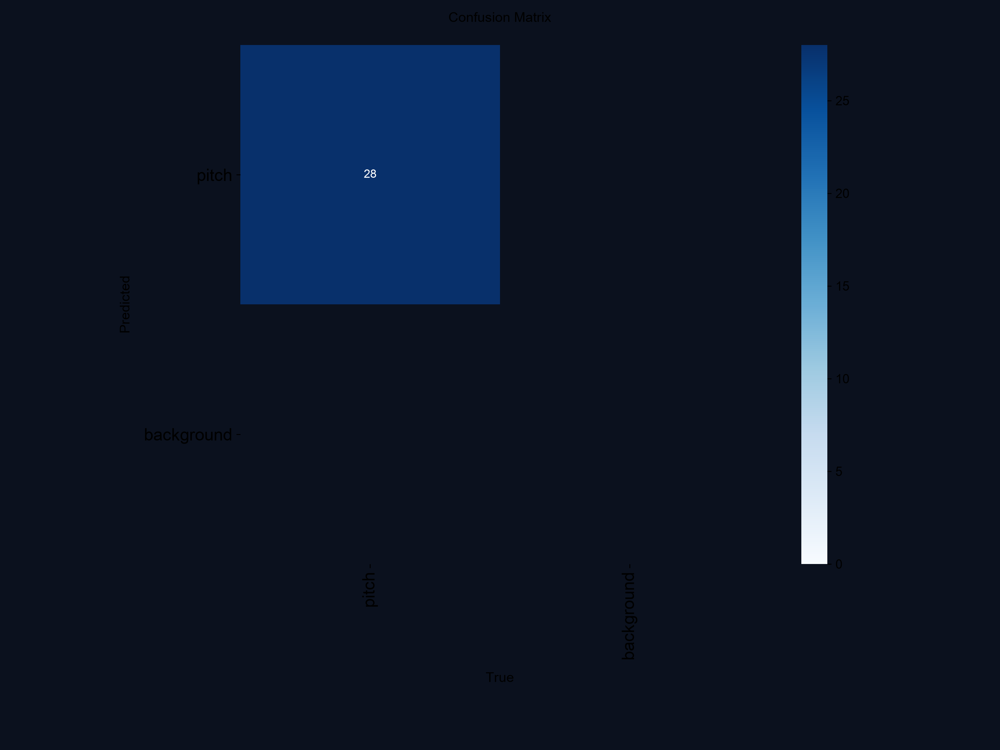

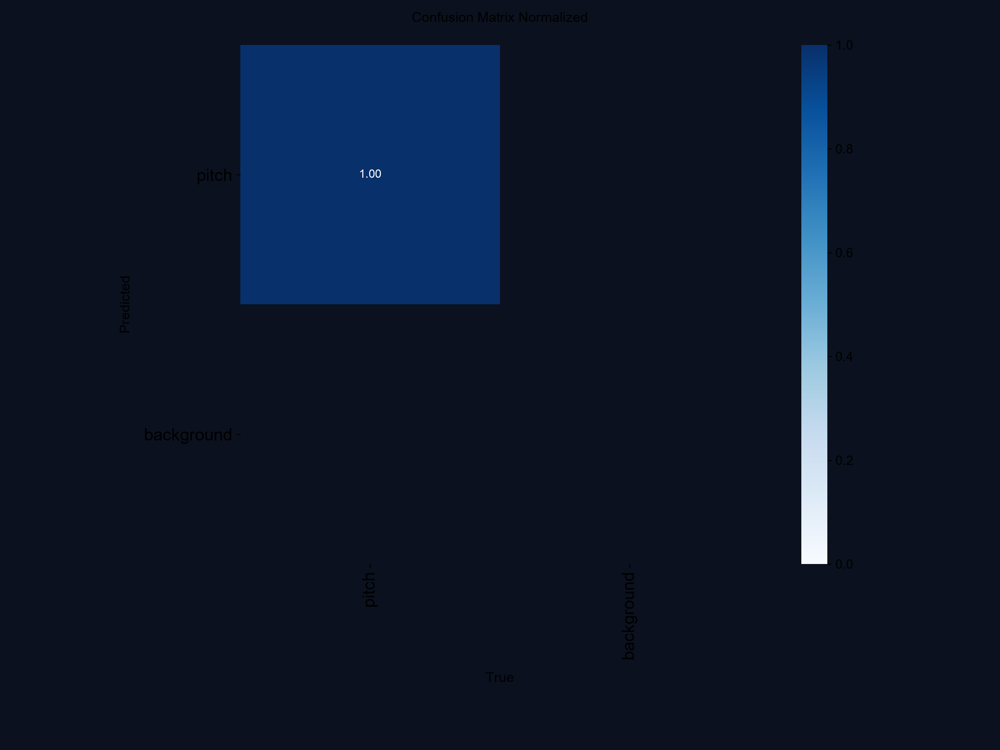

In [156]:
display(IPyImage(filename=f"{FIELD_VAL_DIR}/confusion_matrix.png"))
display(IPyImage(filename=f"{FIELD_VAL_DIR}/confusion_matrix_normalized.png"))


### 6.9, 6.10 & 6.11 — F1 / Precision / Recall confidence curves for key field detection model

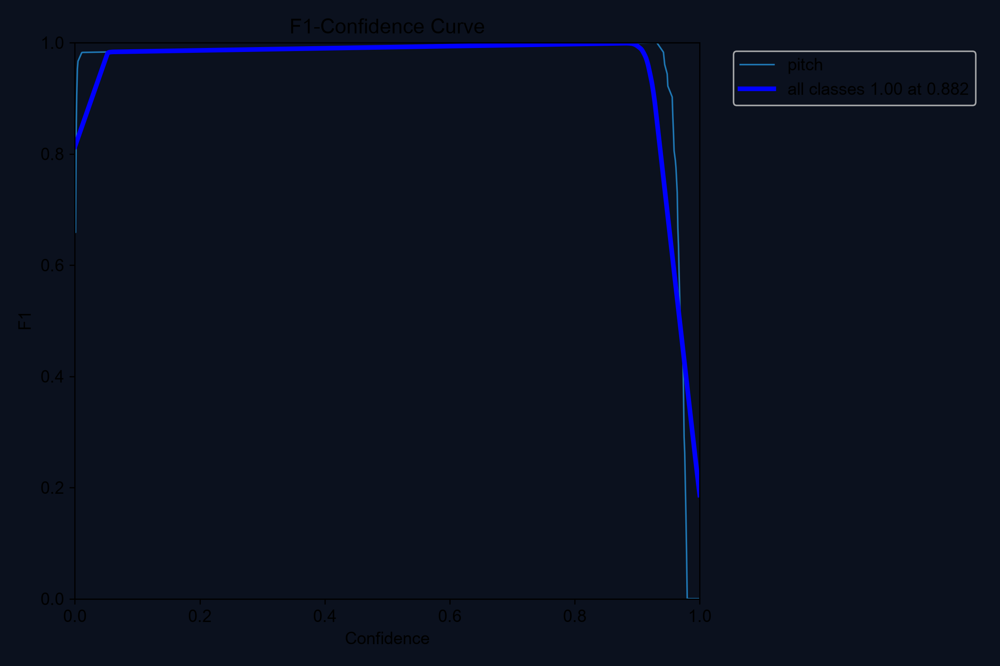

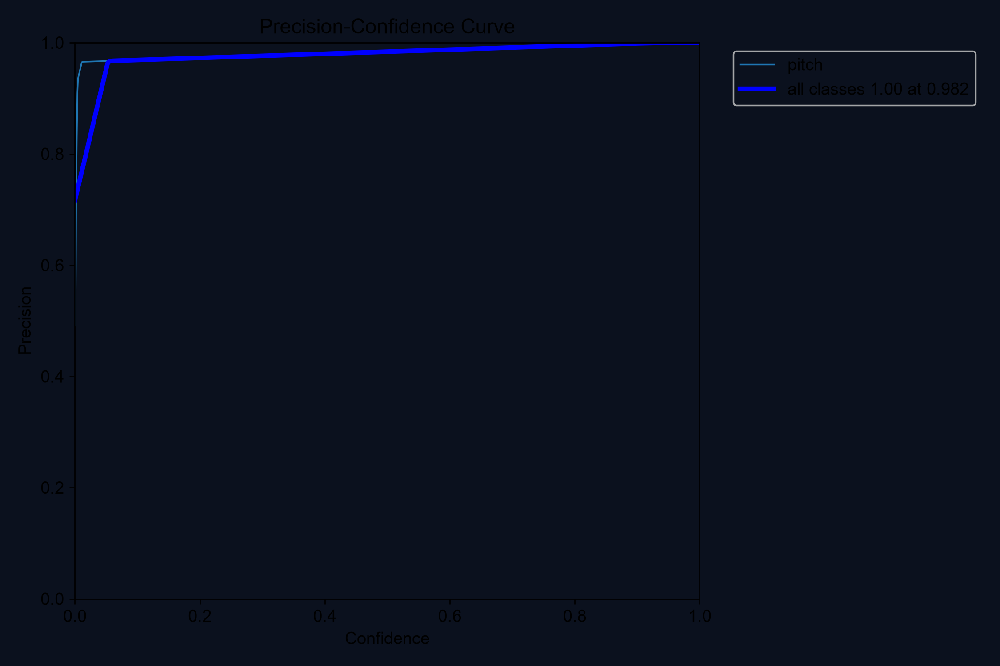

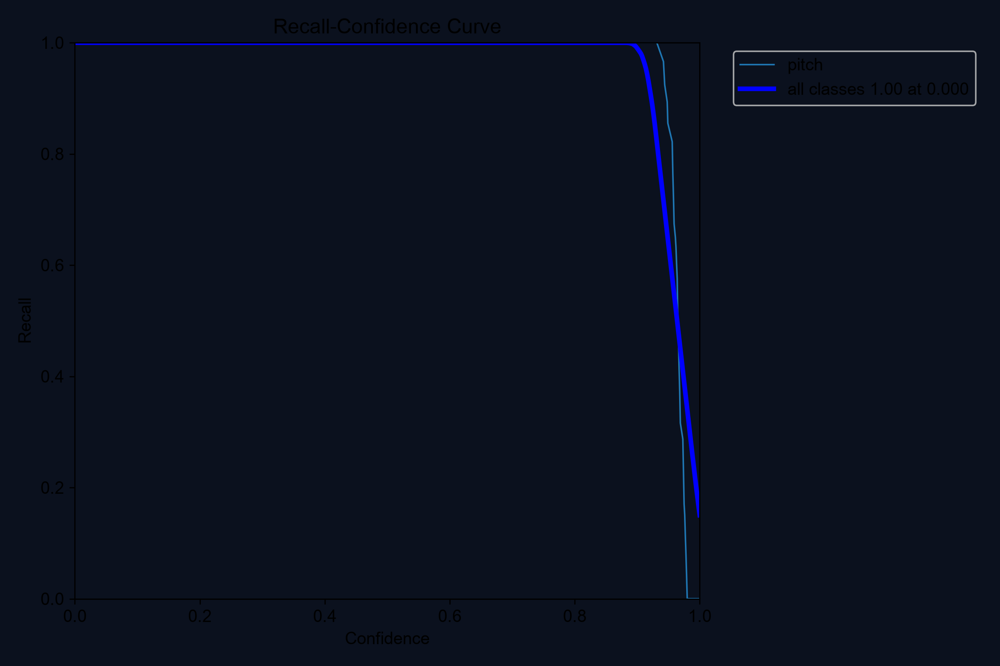

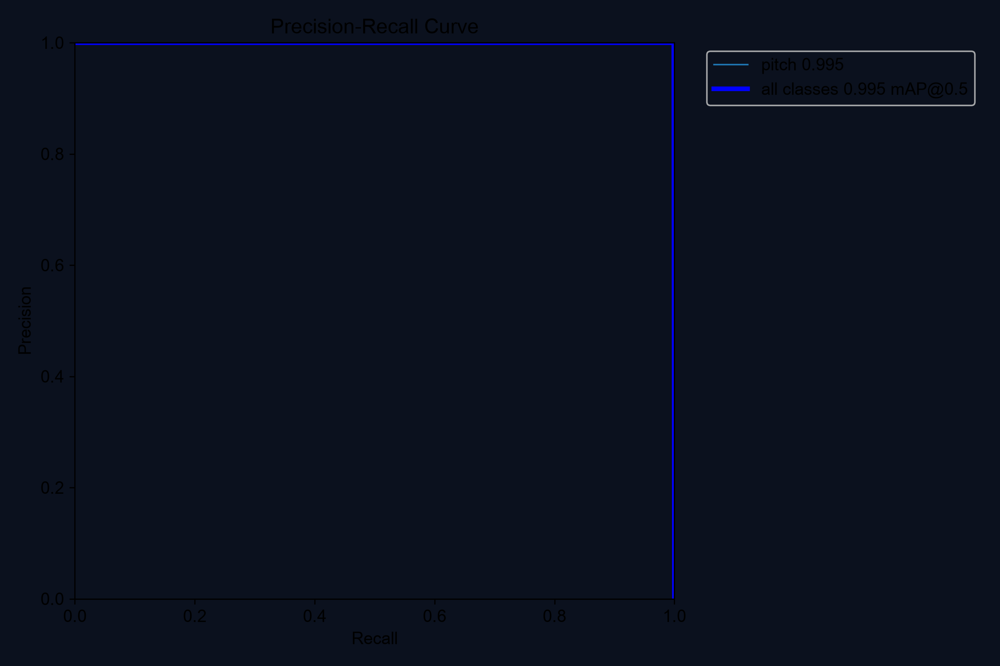

In [157]:
display(IPyImage(filename=f"{FIELD_VAL_DIR}/BoxF1_curve.png"))
display(IPyImage(filename=f"{FIELD_VAL_DIR}/BoxP_curve.png"))
display(IPyImage(filename=f"{FIELD_VAL_DIR}/BoxR_curve.png"))
display(IPyImage(filename=f"{FIELD_VAL_DIR}/BoxPR_curve.png"))



### 6.12 — Training curve graphs for field key points detection

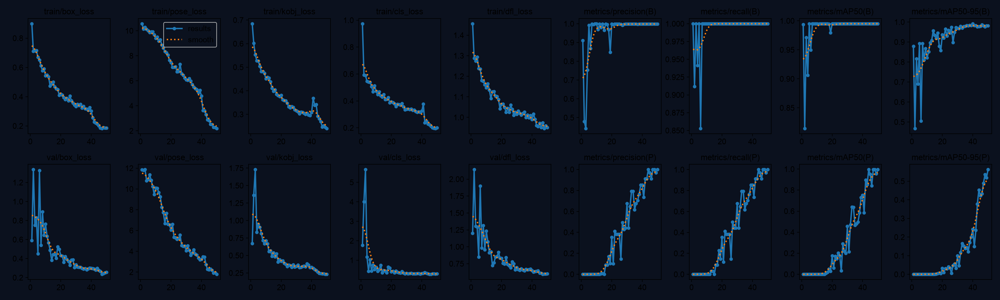

In [158]:
display(IPyImage(filename=f"{FIELD_RUN_DIR}/results.png"))

In [159]:
field_class_names = field_val_metrics.names
field_per_class_map50 = field_val_metrics.box.ap50
field_per_class_map = field_val_metrics.box.maps

field_summary_rows = []
for idx, name in field_class_names.items():
    field_summary_rows.append({
        "class": name,
        "precision": field_val_metrics.box.p[idx],
        "recall": field_val_metrics.box.r[idx],
        "mAP50": field_per_class_map50[idx],
        "mAP50-95": field_per_class_map[idx],
    })

field_metrics_df = pd.DataFrame(field_summary_rows)
print(f"Overall  mAP50: {field_val_metrics.box.map50:.3f}   mAP50-95: {field_val_metrics.box.map:.3f}")
field_metrics_df


Overall  mAP50: 0.995   mAP50-95: 0.991


,class,precision,recall,mAP50,mAP50-95
0,pitch,0.998145,1.0,0.995,0.990714


## pitch keypoint detection

In [160]:
!pip install ipywidgets

python(53206) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [161]:
from inference import get_model

ROBOFLOW_API_KEY = "ITorBkFWNnpJm5kb0lAc"
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"

FIELD_DETECTION_MODEL = get_model(
    model_id=FIELD_DETECTION_MODEL_ID,
    api_key=ROBOFLOW_API_KEY,
    onnx_execution_providers=["CoreMLExecutionProvider", "CPUExecutionProvider"],
)
print(FIELD_DETECTION_MODEL)

2026-08-16 18:37:06.508105 [W:onnxruntime:, coreml_execution_provider.cc:113 GetCapability] CoreMLExecutionProvider::GetCapability, number of partitions supported by CoreML: 11 number of nodes in the graph: 400 number of nodes supported by CoreML: 386


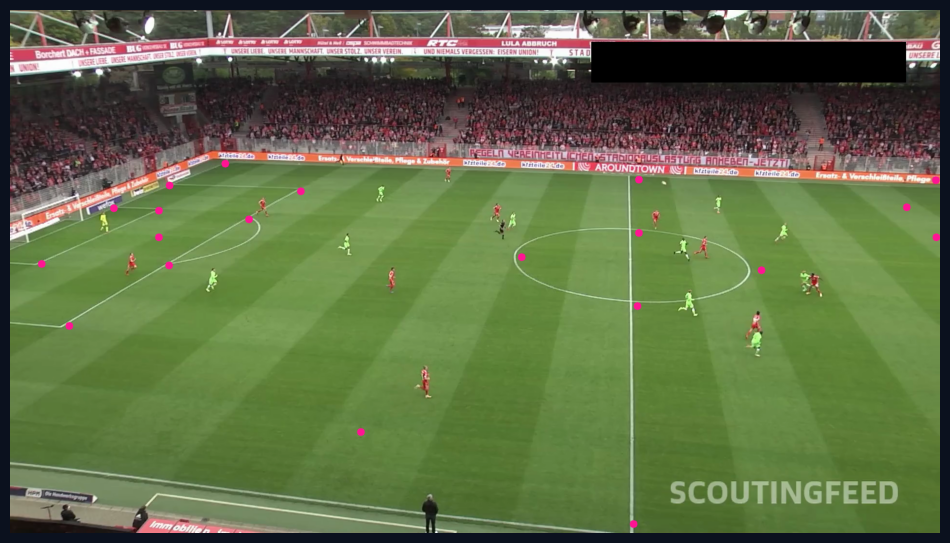

In [162]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

**Note:** Notice that some of the keypoints we detected are in incorrect locations. These are keypoints with a low confidence level. Let's filter out these keypoints and keep only the ones the model is confident about.

## filter low confidence keypoints

'KeyPoints.confidence' is deprecated since 0.29.0 and will be removed in 0.32.0. Use 'KeyPoints.keypoint_confidence' instead.


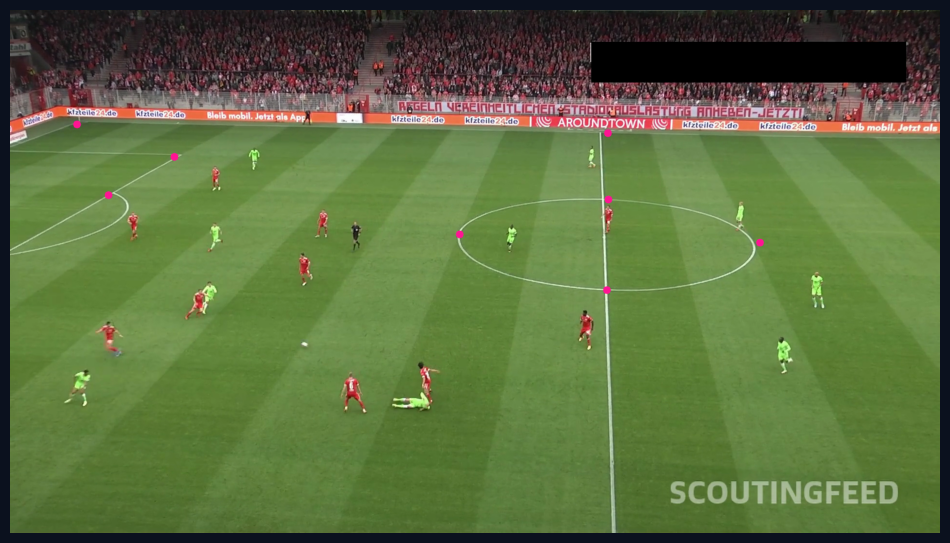

In [163]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project pitch lines on frame

**Note:** The [sports](https://github.com/roboflow/sports) repository contains a [`SoccerPitchConfiguration`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/configs/soccer.py#L6) that provides information about the real-world geometry of the soccer pitch. It also includes utilities for visualizing elements located on the pitch.

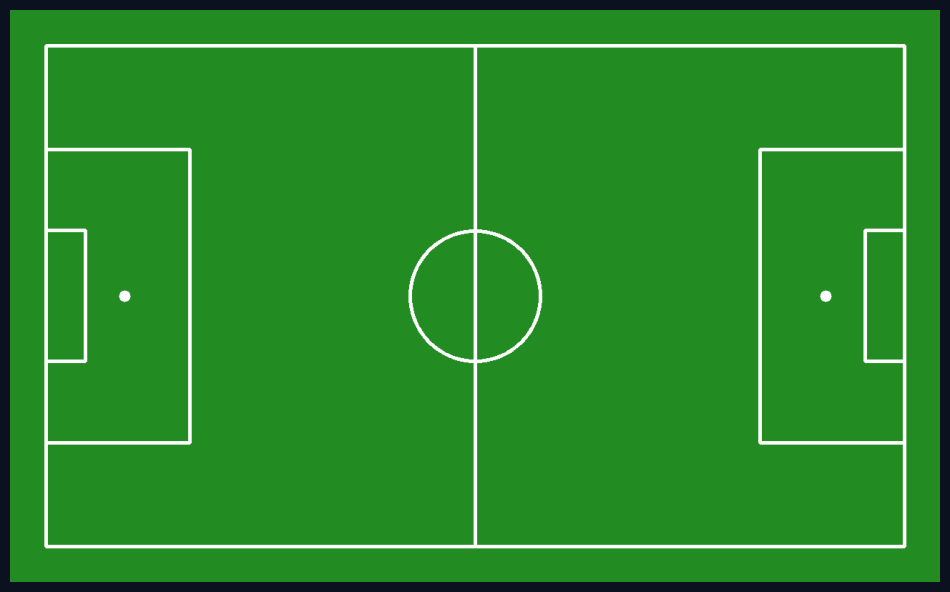

In [164]:
from sports.annotators.soccer import draw_pitch
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

**Note:** It's time to utilize the keypoint pairs located on the camera perspective plane and the football pitch plane. The [sports](https://github.com/roboflow/sports) repository includes a [`ViewTransformer`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/view.py#L7), which employs homography for perspective transformation.

Model returned 20 keypoints; CONFIG has 32 vertices.


'KeyPoints.confidence' is deprecated since 0.29.0 and will be removed in 0.32.0. Use 'KeyPoints.keypoint_confidence' instead.


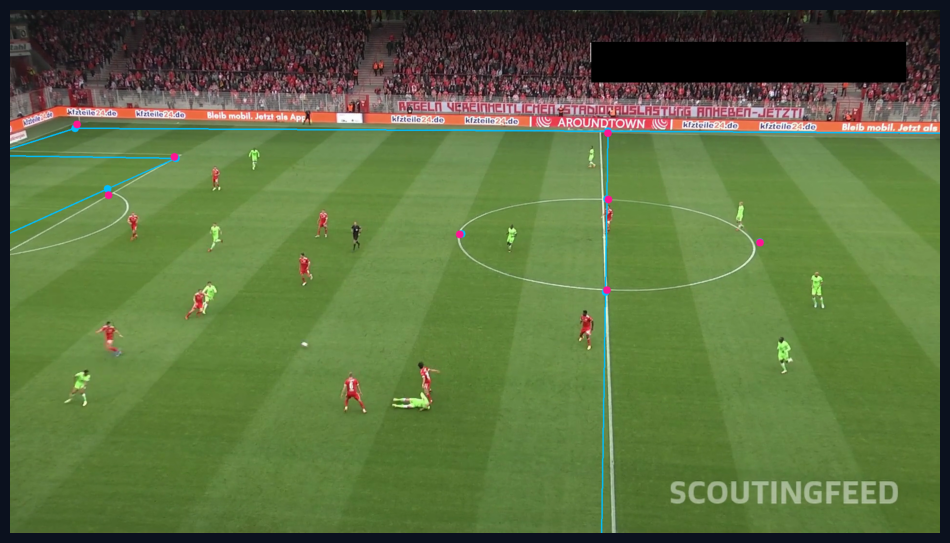

In [165]:
import numpy as np
import supervision as sv
from sports.common.view import ViewTransformer

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"

edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2,
    edges=CONFIG.edges
)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# --- Diagnostics: confirm the actual shapes before doing anything else ---
n_detected = key_points.xy[0].shape[0]
n_config = len(CONFIG.vertices)
print(f"Model returned {n_detected} keypoints; CONFIG has {n_config} vertices.")

if n_detected != n_config:
    print(
        "WARNING: keypoint count mismatch. Falling back to class_id-based "
        "mapping instead of positional indexing."
    )

# --- Build filter on detected points ---
filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]

# --- Map filtered points to CONFIG vertices using class_id, not position ---
# `result.predictions[0].points` (raw inference result) or `key_points` class_id
# tells us which pitch vertex each detected point corresponds to.
# sv.KeyPoints doesn't always expose class_id directly, so pull it from the raw result.
try:
    # Roboflow inference keypoint result: each point has a class_id field
    raw_points = result.predictions[0].keypoints if hasattr(result.predictions[0], "keypoints") else None
except Exception:
    raw_points = None

if raw_points is not None:
    class_ids = np.array([p.class_id for p in raw_points])[filter]
    pitch_reference_points = np.array(CONFIG.vertices)[class_ids]
else:
    # Fallback: if class_id isn't accessible, this only works when counts match
    if n_detected != n_config:
        raise ValueError(
            f"Cannot align {n_detected} detected keypoints with "
            f"{n_config} CONFIG.vertices without class_id mapping. "
            "Inspect `result` to find the correct field for per-point class IDs "
            "(try printing result.predictions[0] or result.dict())."
        )
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...]
)

transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)
frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points
)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points
)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points
)

sv.plot_image(annotated_frame)

## project ball, players and referies on pitch

In [166]:
import torch
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
PLAYER_ID = 2
STRIDE = 30

# Pick the right device for this machine (Mac = no CUDA, use MPS or CPU)
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"   # Apple Silicon GPU
else:
    device = "cpu"

print(f"Using device: {device}")

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device=device)
team_classifier.fit(crops)

Using device: mps


collecting crops: 25it [00:08,  2.82it/s]


Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

Embedding extraction: 16it [00:17,  1.11s/it]
divide by zero encountered in matmul
overflow encountered in matmul
invalid value encountered in matmul


In [167]:
import cv2
from typing import Optional

def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,
    team_2_xy: np.ndarray,
    team_1_color: sv.Color = sv.Color.RED,
    team_2_color: sv.Color = sv.Color.WHITE,
    opacity: float = 0.5,
    padding: int = 50,
    scale: float = 0.1,
    pitch: Optional[np.ndarray] = None
) -> np.ndarray:
    """
    Draws a Voronoi diagram on a soccer pitch representing the control areas of two
    teams with smooth color transitions.

    Args:
        config (SoccerPitchConfiguration): Configuration object containing the
            dimensions and layout of the pitch.
        team_1_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 1.
        team_2_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 2.
        team_1_color (sv.Color, optional): Color representing the control area of
            team 1. Defaults to sv.Color.RED.
        team_2_color (sv.Color, optional): Color representing the control area of
            team 2. Defaults to sv.Color.WHITE.
        opacity (float, optional): Opacity of the Voronoi diagram overlay.
            Defaults to 0.5.
        padding (int, optional): Padding around the pitch in pixels.
            Defaults to 50.
        scale (float, optional): Scaling factor for the pitch dimensions.
            Defaults to 0.1.
        pitch (Optional[np.ndarray], optional): Existing pitch image to draw the
            Voronoi diagram on. If None, a new pitch will be created. Defaults to None.

    Returns:
        np.ndarray: Image of the soccer pitch with the Voronoi diagram overlay.
    """
    if pitch is None:
        pitch = draw_pitch(
            config=config,
            padding=padding,
            scale=scale
        )

    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    y_coordinates, x_coordinates = np.indices((
        scaled_width + 2 * padding,
        scaled_length + 2 * padding
    ))

    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                       (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)

    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    # Increase steepness of the blend effect
    steepness = 15  # Increased steepness for sharper transition
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    # Create the smooth color transition
    for c in range(3):  # Iterate over the B, G, R channels
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] +
                            (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

In [168]:
!pip install -e .

python(53603) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Obtaining file:///Users/suraj/Desktop/VISION11/sports_football/notebook
ERROR: file:///Users/suraj/Desktop/VISION11/sports_football/notebook does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


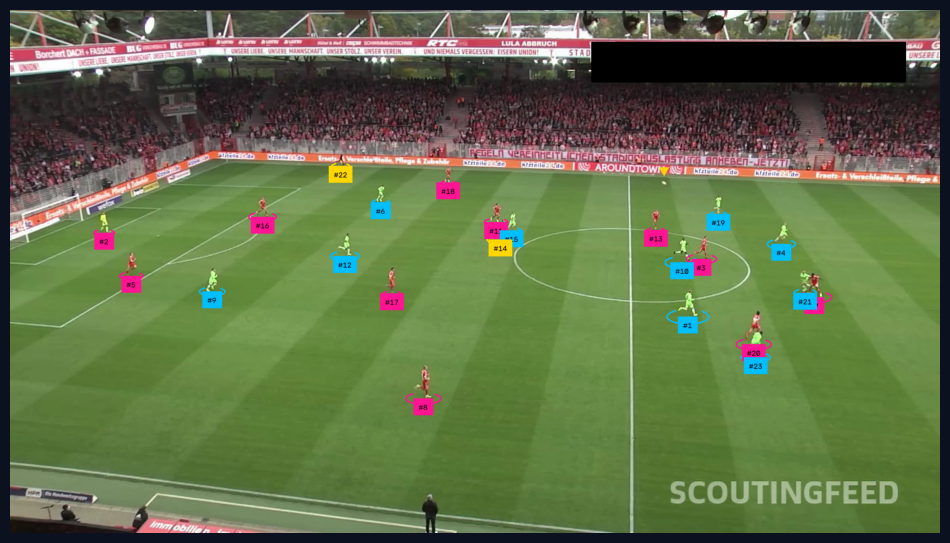



FIELD KEYPOINT DEBUG
XY shape:
(1, 26, 2)

Confidence:
[[    0.97949     0.98291     0.93359     0.27856    0.015381   0.0029297      0.9834     0.59082     0.97949     0.99902     0.99805     0.99023     0.78369     0.99707     0.99854     0.99902     0.87598    0.012939   0.0041504  0.00048828  0.00048828  0.00024414   0.0014648  0.00024414           1     0.97852]]

Class IDs:
[0]

CONFIG vertices:
32

MODEL-DETECTED VALID KEYPOINTS: 1
Class IDs: [0]
Confidence: [    0.97949]

Using the broadcast-pitch 4-corner fallback.
Fallback source points:
[[       19.2       367.2]
 [     1900.8       313.2]
 [     1900.8         972]
 [       19.2         972]]
Fallback pitch points:
[[          0           0]
 [      12000           0]
 [      12000        7000]
 [          0        7000]]
Fallback CONFIG indices:
[0, 24, 29, 5]
SUCCESS: Homography created using 4-corner fallback.


'KeyPoints.confidence' is deprecated since 0.29.0 and will be removed in 0.32.0. Use 'KeyPoints.keypoint_confidence' instead.
'KeyPoints.confidence' is deprecated since 0.29.0 and will be removed in 0.32.0. Use 'KeyPoints.keypoint_confidence' instead.


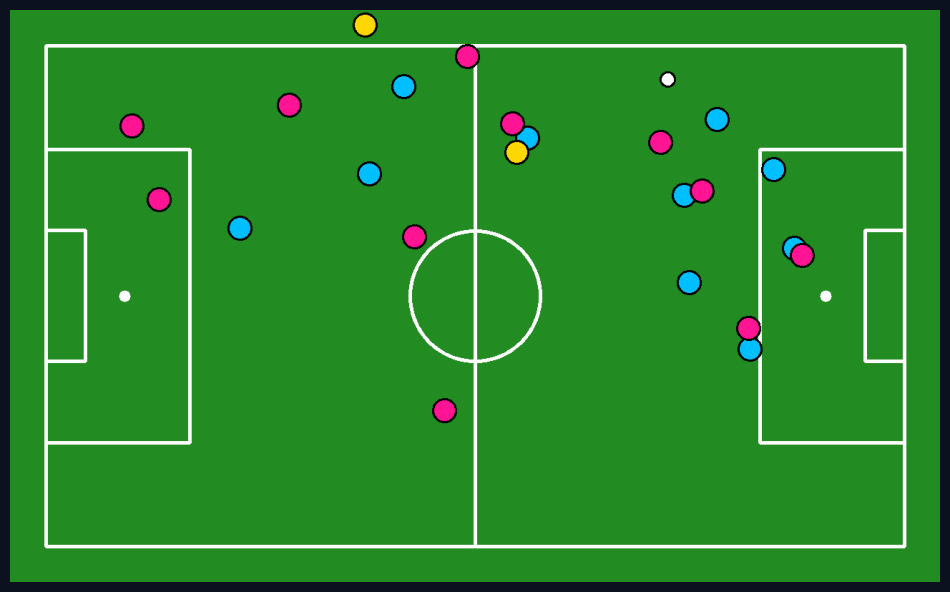

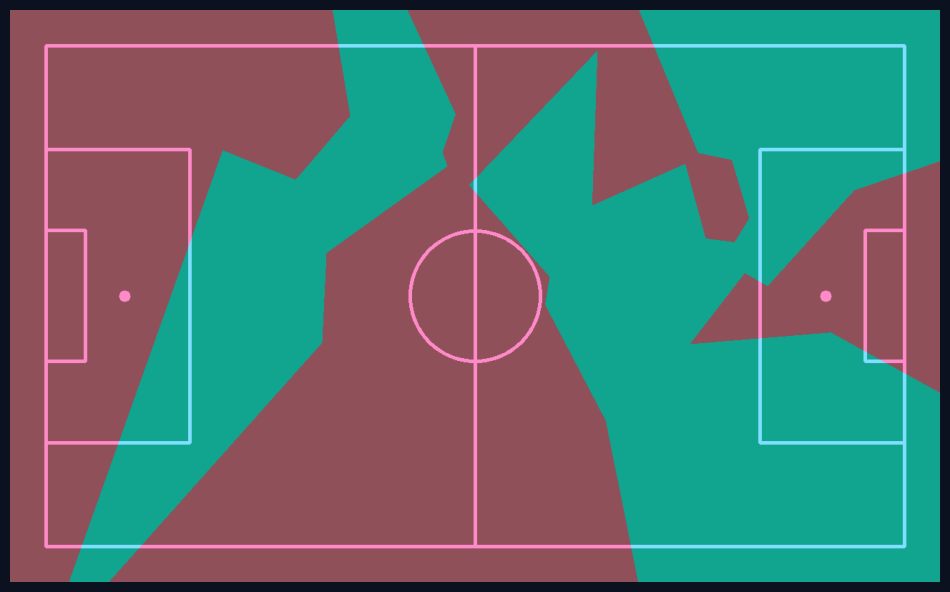

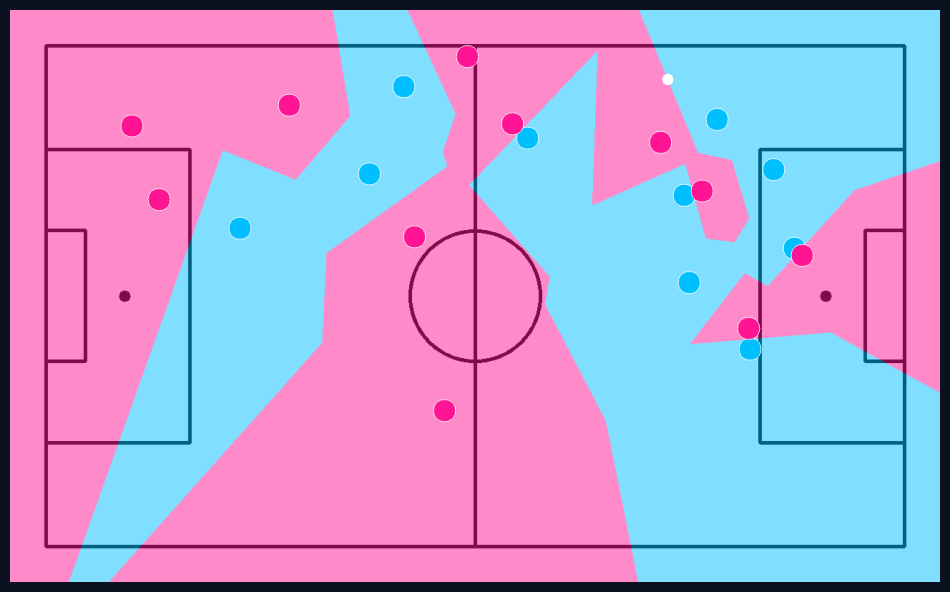

In [169]:
import numpy as np
import supervision as sv

from sports.common.view import ViewTransformer
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram,
)


# ============================================================
# CONFIGURATION
# ============================================================

SOURCE_VIDEO_PATH = (
    "/Users/suraj/Desktop/VISION11/"
    "sports_football/notebook/121364_0.mp4"
)

BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3


# ============================================================
# ANNOTATORS
# ============================================================

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(
        ["#00BFFF", "#FF1493", "#FFD700"]
    ),
    thickness=2,
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(
        ["#00BFFF", "#FF1493", "#FFD700"]
    ),
    text_color=sv.Color.from_hex("#000000"),
    text_position=sv.Position.BOTTOM_CENTER,
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex("#FFD700"),
    base=20,
    height=17,
)


# ============================================================
# TRACKER
# ============================================================

tracker = sv.ByteTrack()
tracker.reset()


# ============================================================
# VIDEO
# ============================================================

frame_generator = sv.get_video_frames_generator(
    SOURCE_VIDEO_PATH
)

frame = next(frame_generator)


# ============================================================
# PLAYER / BALL / REFEREE DETECTION
# ============================================================

result = PLAYER_DETECTION_MODEL.infer(
    frame,
    confidence=0.3,
)[0]

detections = sv.Detections.from_inference(result)


# ============================================================
# BALL
# ============================================================

ball_detections = detections[
    detections.class_id == BALL_ID
]

if len(ball_detections) > 0:
    ball_detections.xyxy = sv.pad_boxes(
        xyxy=ball_detections.xyxy,
        px=10,
    )


# ============================================================
# PLAYERS / GOALKEEPERS / REFEREES
# ============================================================

all_detections = detections[
    detections.class_id != BALL_ID
]

all_detections = all_detections.with_nms(
    threshold=0.5,
    class_agnostic=True,
)

all_detections = tracker.update_with_detections(
    detections=all_detections
)


goalkeepers_detections = all_detections[
    all_detections.class_id == GOALKEEPER_ID
]

players_detections = all_detections[
    all_detections.class_id == PLAYER_ID
]

referees_detections = all_detections[
    all_detections.class_id == REFEREE_ID
]


# ============================================================
# TEAM CLASSIFICATION
# ============================================================

players_crops = [
    sv.crop_image(frame, xyxy)
    for xyxy in players_detections.xyxy
]


if len(players_crops) > 0:

    players_detections.class_id = (
        team_classifier.predict(players_crops)
    )

else:

    players_detections.class_id = np.array(
        [],
        dtype=int,
    )


# ============================================================
# GOALKEEPER TEAM ASSIGNMENT
# ============================================================

if len(goalkeepers_detections) > 0:

    goalkeepers_detections.class_id = (
        resolve_goalkeepers_team_id(
            players_detections,
            goalkeepers_detections,
        )
    )

else:

    goalkeepers_detections.class_id = np.array(
        [],
        dtype=int,
    )


# ============================================================
# REFEREE CLASS ID
# ============================================================

if len(referees_detections) > 0:

    referees_detections.class_id = (
        referees_detections.class_id - 1
    )


# ============================================================
# MERGE DETECTIONS
# ============================================================

all_detections = sv.Detections.merge(
    [
        players_detections,
        goalkeepers_detections,
        referees_detections,
    ]
)


# ============================================================
# FRAME VISUALIZATION
# ============================================================

labels = [
    f"#{tracker_id}"
    for tracker_id in all_detections.tracker_id
]


if all_detections.class_id is not None:

    all_detections.class_id = (
        all_detections.class_id.astype(int)
    )


annotated_frame = frame.copy()


annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
)


annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels,
)


if len(ball_detections) > 0:

    annotated_frame = triangle_annotator.annotate(
        scene=annotated_frame,
        detections=ball_detections,
    )


sv.plot_image(annotated_frame)


# ============================================================
# COMBINE PLAYERS + GOALKEEPERS
# ============================================================

players_detections = sv.Detections.merge(
    [
        players_detections,
        goalkeepers_detections,
    ]
)


# ============================================================
# FIELD KEYPOINT DETECTION
# ============================================================

# Try the field-keypoint model first. If it does not return enough
# reliable points, use a 4-corner fallback based on the visible pitch
# in this broadcast camera. This prevents the ViewTransformer from
# crashing when the field model returns only 1-3 keypoints.
result = FIELD_DETECTION_MODEL.infer(
    frame,
    confidence=0.05,
)[0]

key_points = sv.KeyPoints.from_inference(result)

print("\n")
print("=" * 60)
print("FIELD KEYPOINT DEBUG")
print("=" * 60)
print("XY shape:")
print(key_points.xy.shape)
print("\nConfidence:")
print(key_points.confidence)
print("\nClass IDs:")
print(key_points.class_id)
print("\nCONFIG vertices:")
print(len(CONFIG.vertices))
print("=" * 60)

# ============================================================
# TRY MODEL-DETECTED KEYPOINTS
# ============================================================

transformer = None
frame_reference_points = np.empty((0, 2), dtype=np.float32)
pitch_reference_points = np.empty((0, 2), dtype=np.float32)
filtered_class_ids = np.empty((0,), dtype=int)
filtered_confidence = np.empty((0,), dtype=np.float32)

try:
    detected_xy = np.asarray(
        key_points.xy[0],
        dtype=np.float32,
    )

    detected_confidence = np.asarray(
        key_points.confidence[0],
        dtype=np.float32,
    )

    if key_points.class_id is not None:
        detected_class_ids = np.asarray(
            key_points.class_id[0]
        ).reshape(-1)

        n = min(
            len(detected_xy),
            len(detected_confidence),
            len(detected_class_ids),
        )

        detected_xy = detected_xy[:n]
        detected_confidence = detected_confidence[:n]
        detected_class_ids = detected_class_ids[:n]

        config_vertices = np.asarray(
            CONFIG.vertices,
            dtype=np.float32,
        )

        class_ids_for_mapping = detected_class_ids.copy()

        # Support both 0-based and 1-based model class IDs.
        if (
            len(class_ids_for_mapping) > 0
            and np.max(class_ids_for_mapping) >= len(config_vertices)
            and np.min(class_ids_for_mapping) >= 1
            and np.max(class_ids_for_mapping) <= len(config_vertices)
        ):
            class_ids_for_mapping = class_ids_for_mapping - 1

        valid_mask = (
            np.isfinite(detected_xy).all(axis=1)
            & np.isfinite(detected_confidence)
            & (detected_confidence >= 0.10)
            & (class_ids_for_mapping >= 0)
            & (class_ids_for_mapping < len(config_vertices))
        )

        frame_reference_points = detected_xy[valid_mask]
        filtered_class_ids = class_ids_for_mapping[valid_mask].astype(int)
        filtered_confidence = detected_confidence[valid_mask]

        if len(filtered_class_ids) > 0:
            (
                unique_class_ids,
                unique_indices,
            ) = np.unique(
                filtered_class_ids,
                return_index=True,
            )

            frame_reference_points = frame_reference_points[unique_indices]
            filtered_confidence = filtered_confidence[unique_indices]
            filtered_class_ids = unique_class_ids

            pitch_reference_points = config_vertices[
                filtered_class_ids
            ]

except Exception as e:
    print(f"WARNING: Field keypoint parsing failed: {e}")

print("\nMODEL-DETECTED VALID KEYPOINTS:", len(frame_reference_points))
print("Class IDs:", filtered_class_ids)
print("Confidence:", filtered_confidence)

# ============================================================
# CREATE TRANSFORMER FROM MODEL KEYPOINTS
# ============================================================

if len(frame_reference_points) >= 4:
    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points,
    )
    print(
        f"SUCCESS: Homography created using "
        f"{len(frame_reference_points)} detected field points."
    )

# ============================================================
# FALLBACK: 4 VISIBLE PITCH CORNERS
# ============================================================

if transformer is None:
    print("\nWARNING: Field model returned fewer than 4 usable points.")
    print("Using the broadcast-pitch 4-corner fallback.")

    config_vertices = np.asarray(
        CONFIG.vertices,
        dtype=np.float32,
    )

    if len(config_vertices) < 4:
        raise RuntimeError(
            "CONFIG.vertices contains fewer than 4 points, so "
            "a pitch transformation cannot be created."
        )

    # Find the four outermost pitch vertices from CONFIG.
    # These are the pitch's geometric corners, independent of their
    # exact class IDs/order in the configuration.
    xmin = np.min(config_vertices[:, 0])
    xmax = np.max(config_vertices[:, 0])
    ymin = np.min(config_vertices[:, 1])
    ymax = np.max(config_vertices[:, 1])

    target_corner_candidates = np.array(
        [
            [xmin, ymin],
            [xmax, ymin],
            [xmax, ymax],
            [xmin, ymax],
        ],
        dtype=np.float32,
    )

    # Pick the CONFIG vertex nearest to each corner.
    selected_config_indices = []
    for corner in target_corner_candidates:
        distances = np.linalg.norm(
            config_vertices - corner,
            axis=1,
        )

        order = np.argsort(distances)
        selected_index = None

        for candidate in order:
            candidate = int(candidate)
            if candidate not in selected_config_indices:
                selected_index = candidate
                break

        if selected_index is None:
            raise RuntimeError(
                "Could not select four unique pitch corners from CONFIG.vertices."
            )

        selected_config_indices.append(selected_index)

    pitch_reference_points = config_vertices[
        selected_config_indices
    ]

    # Normalized image coordinates for the pitch boundaries visible
    # in the supplied broadcast frame. Keeping them normalized makes
    # the fallback work with the video's actual resolution.
    frame_h, frame_w = frame.shape[:2]

    frame_reference_points = np.array(
        [
            [0.01 * frame_w, 0.34 * frame_h],  # top-left
            [0.99 * frame_w, 0.29 * frame_h],  # top-right
            [0.99 * frame_w, 0.90 * frame_h],  # bottom-right
            [0.01 * frame_w, 0.90 * frame_h],  # bottom-left
        ],
        dtype=np.float32,
    )

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points,
    )

    print("Fallback source points:")
    print(frame_reference_points)
    print("Fallback pitch points:")
    print(pitch_reference_points)
    print("Fallback CONFIG indices:")
    print(selected_config_indices)
    print("SUCCESS: Homography created using 4-corner fallback.")

# ============================================================
# BALL -> PITCH
# ============================================================

if len(ball_detections) > 0:

    frame_ball_xy = (
        ball_detections.get_anchors_coordinates(
            sv.Position.BOTTOM_CENTER
        )
    )

    pitch_ball_xy = (
        transformer.transform_points(
            points=frame_ball_xy
        )
    )

else:

    pitch_ball_xy = np.empty(
        (0, 2),
        dtype=np.float32,
    )


# ============================================================
# PLAYERS -> PITCH
# ============================================================

if len(players_detections) > 0:

    players_xy = (
        players_detections.get_anchors_coordinates(
            sv.Position.BOTTOM_CENTER
        )
    )

    pitch_players_xy = (
        transformer.transform_points(
            points=players_xy
        )
    )

else:

    pitch_players_xy = np.empty(
        (0, 2),
        dtype=np.float32,
    )


# ============================================================
# REFEREES -> PITCH
# ============================================================

if len(referees_detections) > 0:

    referees_xy = (
        referees_detections.get_anchors_coordinates(
            sv.Position.BOTTOM_CENTER
        )
    )

    pitch_referees_xy = (
        transformer.transform_points(
            points=referees_xy
        )
    )

else:

    pitch_referees_xy = np.empty(
        (0, 2),
        dtype=np.float32,
    )


# ============================================================
# RADAR VIEW
# ============================================================

annotated_frame = draw_pitch(
    CONFIG
)


# ============================================================
# BALL
# ============================================================

if len(pitch_ball_xy) > 0:

    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.BLACK,
        radius=10,
        pitch=annotated_frame,
    )


# ============================================================
# TEAM 1
# ============================================================

if len(pitch_players_xy) > 0:

    team_1_mask = (
        players_detections.class_id == 0
    )

    if np.any(team_1_mask):

        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_players_xy[
                team_1_mask
            ],
            face_color=sv.Color.from_hex(
                "#00BFFF"
            ),
            edge_color=sv.Color.BLACK,
            radius=16,
            pitch=annotated_frame,
        )


# ============================================================
# TEAM 2
# ============================================================

if len(pitch_players_xy) > 0:

    team_2_mask = (
        players_detections.class_id == 1
    )

    if np.any(team_2_mask):

        annotated_frame = draw_points_on_pitch(
            config=CONFIG,
            xy=pitch_players_xy[
                team_2_mask
            ],
            face_color=sv.Color.from_hex(
                "#FF1493"
            ),
            edge_color=sv.Color.BLACK,
            radius=16,
            pitch=annotated_frame,
        )


# ============================================================
# REFEREES
# ============================================================

if len(pitch_referees_xy) > 0:

    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_referees_xy,
        face_color=sv.Color.from_hex(
            "#FFD700"
        ),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=annotated_frame,
    )


sv.plot_image(annotated_frame)


# ============================================================
# VORONOI
# ============================================================

annotated_frame = draw_pitch(
    CONFIG
)


team_1_mask = (
    players_detections.class_id == 0
)

team_2_mask = (
    players_detections.class_id == 1
)


if len(pitch_players_xy) > 0:

    team_1_xy = pitch_players_xy[
        team_1_mask
    ]

    team_2_xy = pitch_players_xy[
        team_2_mask
    ]

else:

    team_1_xy = np.empty(
        (0, 2),
        dtype=np.float32,
    )

    team_2_xy = np.empty(
        (0, 2),
        dtype=np.float32,
    )


# ============================================================
# DRAW VORONOI
# ============================================================

if (
    len(team_1_xy) > 0
    and len(team_2_xy) > 0
):

    annotated_frame = (
        draw_pitch_voronoi_diagram(
            config=CONFIG,
            team_1_xy=team_1_xy,
            team_2_xy=team_2_xy,
            team_1_color=sv.Color.from_hex(
                "#00BFFF"
            ),
            team_2_color=sv.Color.from_hex(
                "#FF1493"
            ),
            pitch=annotated_frame,
        )
    )


sv.plot_image(annotated_frame)


# ============================================================
# VORONOI + WHITE PITCH
# ============================================================

annotated_frame = draw_pitch(
    config=CONFIG,
    background_color=sv.Color.WHITE,
    line_color=sv.Color.BLACK,
)


if (
    len(team_1_xy) > 0
    and len(team_2_xy) > 0
):

    annotated_frame = (
        draw_pitch_voronoi_diagram(
            config=CONFIG,
            team_1_xy=team_1_xy,
            team_2_xy=team_2_xy,
            team_1_color=sv.Color.from_hex(
                "#00BFFF"
            ),
            team_2_color=sv.Color.from_hex(
                "#FF1493"
            ),
            opacity=0.5,
            pitch=annotated_frame,
        )
    )


# ============================================================
# BALL
# ============================================================

if len(pitch_ball_xy) > 0:

    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.WHITE,
        radius=8,
        thickness=1,
        pitch=annotated_frame,
    )


# ============================================================
# TEAM 1
# ============================================================

if len(team_1_xy) > 0:

    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=team_1_xy,
        face_color=sv.Color.from_hex(
            "#00BFFF"
        ),
        edge_color=sv.Color.WHITE,
        radius=16,
        thickness=1,
        pitch=annotated_frame,
    )


# ============================================================
# TEAM 2
# ============================================================

if len(team_2_xy) > 0:

    annotated_frame = draw_points_on_pitch(
        config=CONFIG,
        xy=team_2_xy,
        face_color=sv.Color.from_hex(
            "#FF1493"
        ),
        edge_color=sv.Color.WHITE,
        radius=16,
        thickness=1,
        pitch=annotated_frame,
    )


sv.plot_image(annotated_frame)

## ball tracking

In [170]:
from collections import deque
import numpy as np
import supervision as sv
from tqdm import tqdm
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"
BALL_ID = 0
MAXLEN = 5

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame in tqdm(frame_generator, total=video_info.total_frames):

    # -----------------------------
    # Ball detection
    # -----------------------------
    result = PLAYER_DETECTION_MODEL.infer(
        frame,
        confidence=0.3
    )[0]

    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]

    if len(ball_detections) > 0:
        ball_detections.xyxy = sv.pad_boxes(
            xyxy=ball_detections.xyxy,
            px=10
        )

    # -----------------------------
    # Field keypoint detection
    # -----------------------------
    result = FIELD_DETECTION_MODEL.infer(
        frame,
        confidence=0.3
    )[0]

    key_points = sv.KeyPoints.from_inference(result)

    # Make sure keypoints exist
    if key_points.xy is None or len(key_points.xy) == 0:
        path_raw.append(np.empty((0, 2)))
        continue

    frame_keypoints = key_points.xy[0]
    confidence = key_points.confidence[0]

    # -----------------------------------------
    # IMPORTANT:
    # Model gives 26 keypoints,
    # CONFIG.vertices contains 32 points.
    # -----------------------------------------

    n_frame = len(frame_keypoints)
    n_config = len(CONFIG.vertices)

    n = min(n_frame, n_config)

    frame_keypoints = frame_keypoints[:n]
    confidence = confidence[:n]

    pitch_vertices = np.asarray(CONFIG.vertices)[:n]

    # Confidence filtering
    valid = confidence > 0.5

    frame_reference_points = frame_keypoints[valid]
    pitch_reference_points = pitch_vertices[valid]

    # Need at least 4 points for homography
    if len(frame_reference_points) < 4:
        path_raw.append(np.empty((0, 2)))
        continue

    # -----------------------------
    # View transformation
    # -----------------------------
    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )

    M.append(transformer.m)

    # Smooth transformation matrix
    transformer.m = np.mean(
        np.array(M),
        axis=0
    )

    # -----------------------------
    # Ball position
    # -----------------------------
    if len(ball_detections) == 0:
        path_raw.append(np.empty((0, 2)))
        continue

    frame_ball_xy = ball_detections.get_anchors_coordinates(
        sv.Position.BOTTOM_CENTER
    )

    pitch_ball_xy = transformer.transform_points(
        points=frame_ball_xy
    )

    path_raw.append(pitch_ball_xy)

100%|██████████| 750/750 [03:54<00:00,  3.20it/s]


In [171]:
path = [
    np.empty((0, 2), dtype=np.float32) if coorinates.shape[0] >= 2 else coorinates
    for coorinates
    in path_raw
]

path = [coorinates.flatten() for coorinates in path]

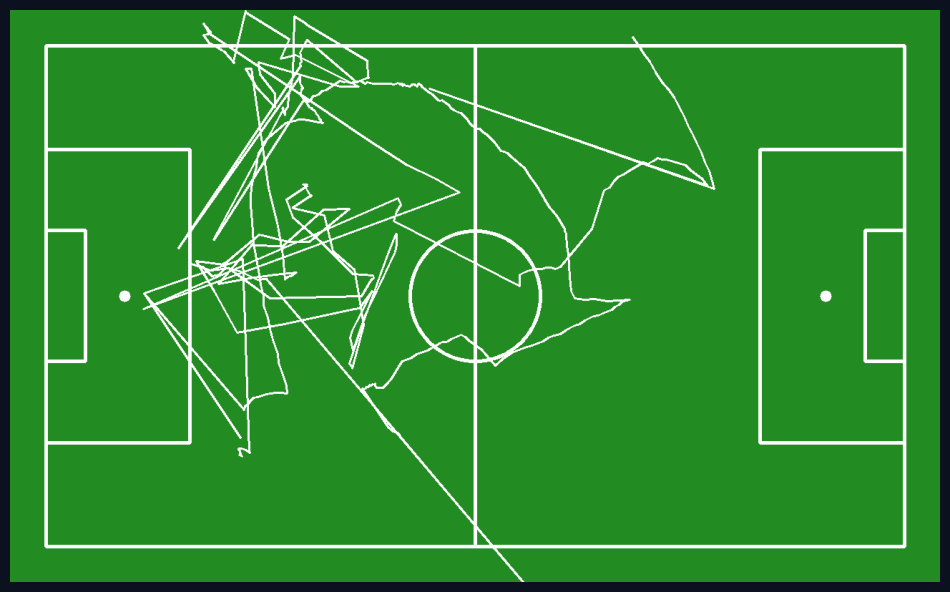

In [172]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

In [173]:
from typing import List, Union

def replace_outliers_based_on_distance(
    positions: List[np.ndarray],
    distance_threshold: float
) -> List[np.ndarray]:
    last_valid_position: Union[np.ndarray, None] = None
    cleaned_positions: List[np.ndarray] = []

    for position in positions:
        if len(position) == 0:
            # If the current position is already empty, just add it to the cleaned positions
            cleaned_positions.append(position)
        else:
            if last_valid_position is None:
                # If there's no valid last position, accept the first valid one
                cleaned_positions.append(position)
                last_valid_position = position
            else:
                # Calculate the distance from the last valid position
                distance = np.linalg.norm(position - last_valid_position)
                if distance > distance_threshold:
                    # Replace with empty array if the distance exceeds the threshold
                    cleaned_positions.append(np.array([], dtype=np.float64))
                else:
                    cleaned_positions.append(position)
                    last_valid_position = position

    return cleaned_positions

In [174]:
MAX_DISTANCE_THRESHOLD = 500

path = replace_outliers_based_on_distance(path, MAX_DISTANCE_THRESHOLD)

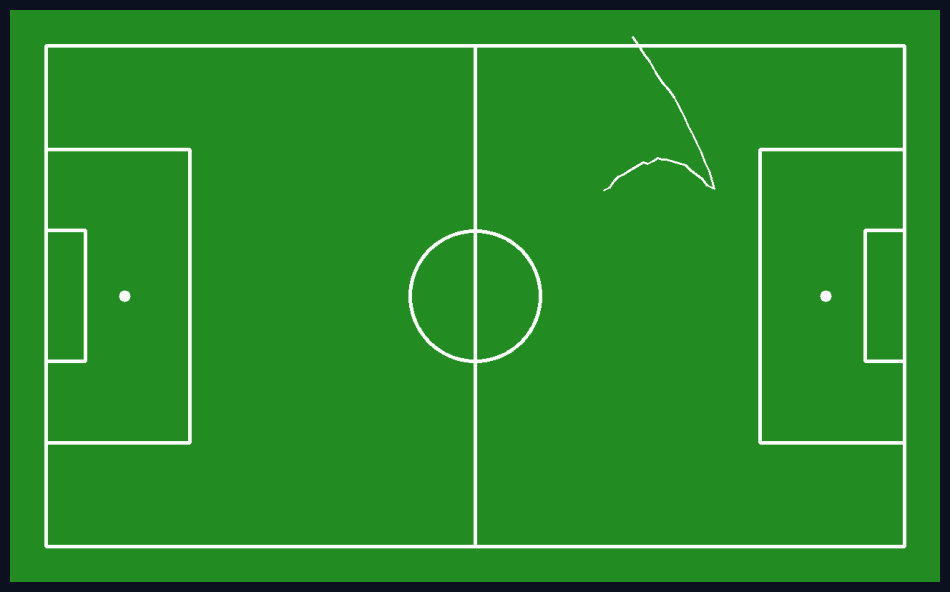

In [175]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

## Heatmap Generation

Collect player positions from the video pipeline and generate heatmaps for each team.

In [176]:


plt.rcParams.update({'figure.facecolor': '#0B111E', 'axes.facecolor': '#0B111E'})

PITCH_W, PITCH_H = 105, 68

def draw_pitch(ax):
    ax.add_patch(patches.Rectangle((0,0), PITCH_W, PITCH_H, facecolor='#2d5a27', zorder=0))
    for i in range(0, 105, 10):
        ax.add_patch(patches.Rectangle((i,0), 5, PITCH_H, facecolor='#3a7a31', zorder=0))
    ax.plot([0,PITCH_W,PITCH_W,0,0],[0,0,PITCH_H,PITCH_H,0], color='white', lw=2, zorder=1)
    ax.plot([52.5,52.5],[0,PITCH_H], color='white', lw=2, zorder=1)
    ax.add_patch(patches.Circle((52.5,PITCH_H/2), 9.15, fill=False, color='white', lw=2, zorder=1))
    ax.plot(52.5, PITCH_H/2, 'o', color='white', zorder=1)
    ax.add_patch(patches.Rectangle((0, (PITCH_H-40.3)/2), 16.5, 40.3, fill=False, color='white', lw=2, zorder=1))
    ax.add_patch(patches.Rectangle((0, (PITCH_H-18.3)/2), 5.5, 18.3, fill=False, color='white', lw=2, zorder=1))
    ax.add_patch(patches.Rectangle((PITCH_W-16.5, (PITCH_H-40.3)/2), 16.5, 40.3, fill=False, color='white', lw=2, zorder=1))
    ax.add_patch(patches.Rectangle((PITCH_W-5.5, (PITCH_H-18.3)/2), 5.5, 18.3, fill=False, color='white', lw=2, zorder=1))
    ax.plot([0,0],[27.5,40.5], color='white', lw=3, zorder=2)
    ax.plot([PITCH_W,PITCH_W],[27.5,40.5], color='white', lw=3, zorder=2)

def generate_heatmap(positions, pitch_w=PITCH_W, pitch_h=PITCH_H, sigma=8):
    heatmap = np.zeros((pitch_h, pitch_w))
    for pos in positions:
        if len(pos) == 0:
            continue
        x = np.clip(pos[:, 0], 0, pitch_w)
        y = np.clip(pos[:, 1], 0, pitch_h)
        for xi, yi in zip(x, y):
            heatmap[int(yi), int(xi)] += 1
    heatmap = gaussian_filter(heatmap, sigma=sigma)
    return heatmap

print('Heatmap function ready.')

Heatmap function ready.


Pitch dimensions: 12000 x 7000


divide by zero encountered in matmul
overflow encountered in matmul
invalid value encountered in matmul


Collected 549 valid jersey-color samples
Cluster balance: {np.int32(0): np.int64(97), np.int32(1): np.int64(452)}


100%|██████████| 750/750 [03:50<00:00,  3.26it/s]


Team 1: 639 position frames
Team 2: 750 position frames
Team 1 total points: 1652
Team 2 total points: 8004
Saved heatmap_report.png


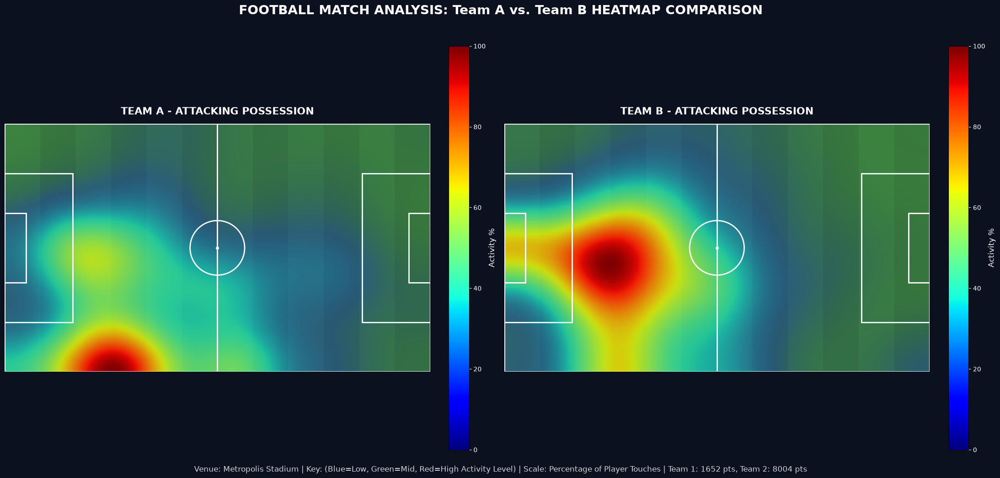

In [177]:
import supervision as sv
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import cm, colormaps
from scipy.ndimage import gaussian_filter
from sklearn.cluster import KMeans
from tqdm import tqdm

# ============================================================
# CONFIG
# ============================================================
SOURCE_VIDEO_PATH = "/Users/suraj/Desktop/VISION11/sports_football/notebook/121364_0.mp4"

BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Pitch dimensions pulled from your actual CONFIG object.
# Standard Roboflow SoccerPitchConfiguration uses
# .length (x-axis) and .width (y-axis).
PITCH_W = CONFIG.length
PITCH_H = CONFIG.width

print(f"Pitch dimensions: {PITCH_W} x {PITCH_H}")

MAX_SAMPLE_FRAMES = 50

team1_positions = []
team2_positions = []


# ============================================================
# STEP 1: Robust jersey-color extraction + team clustering
# ============================================================
def get_jersey_color_hsv(crop):
    """
    Extract the median HSV color from the torso area of a player.
    Green pixels are removed to reduce interference from the pitch.
    """
    if crop is None or crop.size == 0:
        return None

    h = crop.shape[0]

    # Focus on upper/middle torso
    torso = crop[int(h * 0.15): int(h * 0.55), :, :]

    if torso.size == 0:
        return None

    hsv = cv2.cvtColor(torso, cv2.COLOR_BGR2HSV)

    # Mask green pitch pixels
    green_mask = cv2.inRange(
        hsv,
        (35, 40, 40),
        (85, 255, 255)
    )

    non_green = hsv[green_mask == 0]

    if non_green.shape[0] < 10:
        return None

    return np.median(non_green, axis=0)


# ============================================================
# Collect jersey color samples
# ============================================================
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

color_samples = []
sample_frame_count = 0

for frame in frame_generator:

    if sample_frame_count >= MAX_SAMPLE_FRAMES:
        break

    result = PLAYER_DETECTION_MODEL.infer(
        frame,
        confidence=0.3
    )[0]

    detections = sv.Detections.from_inference(result)

    players_only = detections[
        detections.class_id == PLAYER_ID
    ]

    for box in players_only.xyxy:

        x1, y1, x2, y2 = box.astype(int)

        crop = frame[
            max(y1, 0):y2,
            max(x1, 0):x2
        ]

        color = get_jersey_color_hsv(crop)

        if color is not None:
            color_samples.append(color)

    sample_frame_count += 1


color_samples = np.array(color_samples)

print(
    f"Collected {len(color_samples)} "
    f"valid jersey-color samples"
)


# ============================================================
# Team clustering
# ============================================================
if len(color_samples) < 2:
    raise ValueError(
        "Not enough jersey-color samples to perform "
        "2-cluster KMeans."
    )

team_kmeans = KMeans(
    n_clusters=2,
    n_init=10,
    random_state=0
).fit(color_samples)

labels, counts = np.unique(
    team_kmeans.labels_,
    return_counts=True
)

print(
    "Cluster balance:",
    dict(zip(labels, counts))
)

if min(counts) < 0.15 * len(team_kmeans.labels_):
    print(
        "WARNING: clusters are heavily imbalanced — "
        "team split may be unreliable."
    )


# ============================================================
# STEP 2: Main extraction loop
# ============================================================
frame_generator = sv.get_video_frames_generator(
    SOURCE_VIDEO_PATH
)

for frame in tqdm(
    frame_generator,
    total=video_info.total_frames
):

    # --------------------------------------------------------
    # Player detection
    # --------------------------------------------------------
    result = PLAYER_DETECTION_MODEL.infer(
        frame,
        confidence=0.3
    )[0]

    detections = sv.Detections.from_inference(result)

    # Remove ball before tracking
    all_detections = detections[
        detections.class_id != BALL_ID
    ]

    # NMS
    all_detections = all_detections.with_nms(
        threshold=0.5,
        class_agnostic=True
    )

    # Tracking
    all_detections = tracker.update_with_detections(
        detections=all_detections
    )

    # --------------------------------------------------------
    # Separate players and goalkeepers
    # --------------------------------------------------------
    players_detections = all_detections[
        all_detections.class_id == PLAYER_ID
    ]

    goalkeepers_detections = all_detections[
        all_detections.class_id == GOALKEEPER_ID
    ]

    players_detections = sv.Detections.merge(
        [
            players_detections,
            goalkeepers_detections
        ]
    )

    if len(players_detections) == 0:
        continue

    # --------------------------------------------------------
    # Field / pitch keypoint detection
    # --------------------------------------------------------
    result = FIELD_DETECTION_MODEL.infer(
        frame,
        confidence=0.3
    )[0]

    key_points = sv.KeyPoints.from_inference(result)

    if key_points.xy is None or len(key_points.xy) == 0:
        continue

    frame_kp = key_points.xy[0]
    conf = key_points.confidence[0]

    n = min(
        len(frame_kp),
        len(CONFIG.vertices)
    )

    valid = conf[:n] > 0.5

    if valid.sum() < 4:
        continue

    # --------------------------------------------------------
    # Perspective transformation
    # --------------------------------------------------------
    transformer = ViewTransformer(
        source=frame_kp[valid],
        target=np.asarray(CONFIG.vertices)[:n][valid]
    )

    players_xy = players_detections.get_anchors_coordinates(
        sv.Position.BOTTOM_CENTER
    )

    pitch_xy = transformer.transform_points(
        players_xy
    )

    # --------------------------------------------------------
    # Assign players to teams
    # --------------------------------------------------------
    team_ids = []
    valid_idx = []

    for i, box in enumerate(
        players_detections.xyxy
    ):

        x1, y1, x2, y2 = box.astype(int)

        crop = frame[
            max(y1, 0):y2,
            max(x1, 0):x2
        ]

        color = get_jersey_color_hsv(crop)

        if color is not None:

            team_id = team_kmeans.predict(
                color.reshape(1, -1)
            )[0]

            team_ids.append(team_id)
            valid_idx.append(i)

    if not team_ids:
        continue

    team_ids = np.array(team_ids)

    pitch_xy_valid = pitch_xy[valid_idx]

    # --------------------------------------------------------
    # Store team positions
    # --------------------------------------------------------
    for tid in [0, 1]:

        mask = team_ids == tid

        if np.any(mask):

            if tid == 0:
                team1_positions.append(
                    pitch_xy_valid[mask]
                )
            else:
                team2_positions.append(
                    pitch_xy_valid[mask]
                )


print(
    f"Team 1: {len(team1_positions)} position frames"
)

print(
    f"Team 2: {len(team2_positions)} position frames"
)


# ============================================================
# STEP 3: Concatenate all positions
# ============================================================
team1_all = (
    np.concatenate(team1_positions)
    if team1_positions
    else np.empty((0, 2))
)

team2_all = (
    np.concatenate(team2_positions)
    if team2_positions
    else np.empty((0, 2))
)

print(
    f"Team 1 total points: {len(team1_all)}"
)

print(
    f"Team 2 total points: {len(team2_all)}"
)


# ============================================================
# STEP 4: Heatmap generation
# ============================================================
def generate_heatmap(
    positions,
    pitch_w=PITCH_W,
    pitch_h=PITCH_H,
    sigma=10
):
    """
    Convert player pitch coordinates into a smoothed
    2D activity heatmap.
    """

    positions = np.asarray(
        positions,
        dtype=float
    )

    # Handle 1D input
    if positions.ndim == 1:

        if positions.size == 0:
            positions = positions.reshape(0, 2)

        elif positions.size % 2 != 0:
            raise ValueError(
                f"Cannot reshape {positions.size} "
                "values into (x, y) pairs"
            )

        else:
            positions = positions.reshape(-1, 2)

    # Fixed resolution
    grid_w = 120
    grid_h = 80

    heatmap = np.zeros(
        (grid_h, grid_w),
        dtype=float
    )

    if positions.shape[0] == 0:
        return heatmap

    # Convert pitch coordinates to heatmap coordinates
    x = np.clip(
        positions[:, 0] / pitch_w * grid_w,
        0,
        grid_w - 1
    ).astype(int)

    y = np.clip(
        positions[:, 1] / pitch_h * grid_h,
        0,
        grid_h - 1
    ).astype(int)

    # Accumulate player positions
    for xi, yi in zip(x, y):
        heatmap[yi, xi] += 1

    # Gaussian smoothing
    if sigma > 0:
        heatmap = gaussian_filter(
            heatmap,
            sigma=sigma
        )

    return heatmap


heatmap1 = generate_heatmap(team1_all)
heatmap2 = generate_heatmap(team2_all)


# Normalize to 0-100
if heatmap1.max() > 0:
    heatmap1 = (
        heatmap1 /
        heatmap1.max()
        * 100
    )

if heatmap2.max() > 0:
    heatmap2 = (
        heatmap2 /
        heatmap2.max()
        * 100
    )


# ============================================================
# STEP 5: Real green pitch drawing
# ============================================================
def draw_pitch(
    ax,
    pitch_w=PITCH_W,
    pitch_h=PITCH_H
):

    ax.set_facecolor('#3a7d3a')

    # Main pitch
    ax.add_patch(
        patches.Rectangle(
            (0, 0),
            pitch_w,
            pitch_h,
            facecolor='#3a7d3a',
            zorder=0
        )
    )

    # --------------------------------------------------------
    # Pitch stripes
    # --------------------------------------------------------
    n_stripes = 12
    stripe_w = pitch_w / n_stripes

    for i in range(n_stripes):

        if i % 2 == 0:

            ax.add_patch(
                patches.Rectangle(
                    (
                        i * stripe_w,
                        0
                    ),
                    stripe_w,
                    pitch_h,
                    facecolor='#428f42',
                    zorder=0,
                    alpha=0.5
                )
            )

    # --------------------------------------------------------
    # Pitch markings
    # --------------------------------------------------------
    line_color = 'white'
    lw = 2

    # Outer boundary
    ax.add_patch(
        patches.Rectangle(
            (0, 0),
            pitch_w,
            pitch_h,
            fill=False,
            edgecolor=line_color,
            linewidth=lw,
            zorder=2
        )
    )

    # Halfway line
    ax.plot(
        [pitch_w / 2, pitch_w / 2],
        [0, pitch_h],
        color=line_color,
        linewidth=lw,
        zorder=2
    )

    # Center circle
    center_circle = patches.Circle(
        (
            pitch_w / 2,
            pitch_h / 2
        ),
        pitch_h * 0.11,
        fill=False,
        edgecolor=line_color,
        linewidth=lw,
        zorder=2
    )

    ax.add_patch(center_circle)

    # Center spot
    ax.plot(
        pitch_w / 2,
        pitch_h / 2,
        'o',
        color=line_color,
        markersize=4,
        zorder=2
    )

    # --------------------------------------------------------
    # Penalty boxes
    # --------------------------------------------------------
    box_w = pitch_w * 0.16
    box_h = pitch_h * 0.6

    six_yard_w = pitch_w * 0.05
    six_yard_h = pitch_h * 0.28

    for x0 in [
        0,
        pitch_w - box_w
    ]:

        ax.add_patch(
            patches.Rectangle(
                (
                    x0,
                    (pitch_h - box_h) / 2
                ),
                box_w,
                box_h,
                fill=False,
                edgecolor=line_color,
                linewidth=lw,
                zorder=2
            )
        )

    # --------------------------------------------------------
    # Six-yard boxes
    # --------------------------------------------------------
    for x0 in [
        0,
        pitch_w - six_yard_w
    ]:

        ax.add_patch(
            patches.Rectangle(
                (
                    x0,
                    (pitch_h - six_yard_h) / 2
                ),
                six_yard_w,
                six_yard_h,
                fill=False,
                edgecolor=line_color,
                linewidth=lw,
                zorder=2
            )
        )

    # --------------------------------------------------------
    # Axis configuration
    # --------------------------------------------------------
    ax.set_xlim(
        0,
        pitch_w
    )

    ax.set_ylim(
        0,
        pitch_h
    )

    ax.set_aspect('equal')

    ax.axis('off')


# ============================================================
# STEP 6: Heatmap overlay
# ============================================================
def heatmap_to_rgba(
    heatmap,
    cmap_name='jet',
    alpha_gamma=0.6
):
    """
    Convert heatmap values into RGBA.

    IMPORTANT:
    New Matplotlib versions no longer expose
    cm.get_cmap() in the same way.

    Use matplotlib.colormaps.get_cmap() instead.
    """

    # Normalize 0-100 -> 0-1
    norm = np.clip(
        heatmap / 100.0,
        0,
        1
    )

    # --------------------------------------------------------
    # FIX FOR:
    # AttributeError:
    # module 'matplotlib.cm' has no attribute 'get_cmap'
    # --------------------------------------------------------
    cmap = colormaps.get_cmap(cmap_name)

    # Convert normalized values to RGBA
    rgba = cmap(norm)

    # Make low-activity regions transparent
    rgba[..., 3] = norm ** alpha_gamma

    return rgba


# ============================================================
# STEP 7: Visualization
# ============================================================
fig, axes = plt.subplots(
    1,
    2,
    figsize=(22, 11),
    facecolor='#0B111E'
)


# ============================================================
# TEAM A
# ============================================================
draw_pitch(axes[0])

rgba1 = heatmap_to_rgba(
    heatmap1,
    cmap_name='jet',
    alpha_gamma=0.6
)

axes[0].imshow(
    rgba1,
    extent=[
        0,
        PITCH_W,
        0,
        PITCH_H
    ],
    origin='lower',
    zorder=1,
    interpolation='bilinear'
)

axes[0].set_title(
    'TEAM A - ATTACKING POSSESSION',
    color='white',
    fontsize=16,
    fontweight='bold',
    pad=15
)


# ============================================================
# TEAM A COLORBAR
# ============================================================
sm1 = cm.ScalarMappable(
    cmap=colormaps.get_cmap('jet'),
    norm=plt.Normalize(
        0,
        100
    )
)

sm1.set_array([])

cbar1 = plt.colorbar(
    sm1,
    ax=axes[0],
    fraction=0.046,
    pad=0.04
)

cbar1.set_label(
    'Activity %',
    color='white',
    fontsize=12
)

cbar1.ax.yaxis.set_tick_params(
    color='white'
)

plt.setp(
    plt.getp(
        cbar1.ax.axes,
        'yticklabels'
    ),
    color='white'
)


# ============================================================
# TEAM B
# ============================================================
draw_pitch(axes[1])

rgba2 = heatmap_to_rgba(
    heatmap2,
    cmap_name='jet',
    alpha_gamma=0.6
)

axes[1].imshow(
    rgba2,
    extent=[
        0,
        PITCH_W,
        0,
        PITCH_H
    ],
    origin='lower',
    zorder=1,
    interpolation='bilinear'
)

axes[1].set_title(
    'TEAM B - ATTACKING POSSESSION',
    color='white',
    fontsize=16,
    fontweight='bold',
    pad=15
)


# ============================================================
# TEAM B COLORBAR
# ============================================================
sm2 = cm.ScalarMappable(
    cmap=colormaps.get_cmap('jet'),
    norm=plt.Normalize(
        0,
        100
    )
)

sm2.set_array([])

cbar2 = plt.colorbar(
    sm2,
    ax=axes[1],
    fraction=0.046,
    pad=0.04
)

cbar2.set_label(
    'Activity %',
    color='white',
    fontsize=12
)

cbar2.ax.yaxis.set_tick_params(
    color='white'
)

plt.setp(
    plt.getp(
        cbar2.ax.axes,
        'yticklabels'
    ),
    color='white'
)


# ============================================================
# MAIN TITLE
# ============================================================
fig.suptitle(
    'FOOTBALL MATCH ANALYSIS: '
    'Team A vs. Team B HEATMAP COMPARISON',
    color='white',
    fontsize=20,
    fontweight='bold',
    y=0.96
)


# ============================================================
# FOOTER
# ============================================================
fig.text(
    0.5,
    0.03,
    f'Venue: Metropolis Stadium | '
    f'Key: (Blue=Low, Green=Mid, Red=High Activity Level) | '
    f'Scale: Percentage of Player Touches | '
    f'Team 1: {len(team1_all)} pts, '
    f'Team 2: {len(team2_all)} pts',
    ha='center',
    color='lightgray',
    fontsize=12
)


# ============================================================
# LAYOUT
# ============================================================
plt.tight_layout(
    rect=[
        0,
        0.06,
        1,
        0.93
    ]
)


# ============================================================
# SAVE
# ============================================================
OUTPUT_PATH = 'heatmap_report.png'

plt.savefig(
    OUTPUT_PATH,
    dpi=150,
    facecolor='#0B111E',
    bbox_inches='tight'
)

print(
    f'Saved {OUTPUT_PATH}'
)

plt.show()